In [4]:
import os
import librosa
import numpy as np
import pandas as pd
import shutil
import random
import pickle
import time
import joblib
import soundfile as sf
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.io import wavfile
from scipy.signal import wiener
from matplotlib.backends.backend_pdf import PdfPages
import scipy.signal as signal
import librosa.display
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, roc_curve, auc
import warnings
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_predict, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
import lime.lime_tabular
import joblib
import re
from hmmlearn.hmm import GaussianHMM
from xgboost import XGBClassifier

# Data Preprocessing

## Resampling and Conversion to Mono

In [2]:
# Define paths
raw_samples_dir = r"E:\PythonJupyter\70_30 Split\RawSamples"
resampled_dir = r"E:\PythonJupyter\70_30 Split\ReSampled"

# Create output directory if not exists
os.makedirs(resampled_dir, exist_ok=True)

# Iterate through subfolders
for subfolder in sorted(os.listdir(raw_samples_dir)):
    subfolder_path = os.path.join(raw_samples_dir, subfolder)
    
    if os.path.isdir(subfolder_path):
        # Create corresponding subfolder in Resampled_Samples
        output_subfolder = os.path.join(resampled_dir, subfolder)
        os.makedirs(output_subfolder, exist_ok=True)

        # Process each wav file
        for file in sorted(os.listdir(subfolder_path)):
            if file.endswith(".wav"):
                input_file = os.path.join(subfolder_path, file)
                output_file = os.path.join(output_subfolder, file)
                
                # Load audio file
                audio, sr = librosa.load(input_file, sr=44100, mono=True)

                # Save resampled audio
                sf.write(output_file, audio, samplerate=44100)

print("Resampling complete. All files saved in:", resampled_dir)

Resampling complete. All files saved in: E:\PythonJupyter\70_30 Split\ReSampled


## FFT Plots

In [3]:
# Define paths
resampled_dir = r"E:\PythonJupyter\70_30 Split\ReSampled"
output_pdf = r"E:\PythonJupyter\70_30 Split\FFT_Plots.pdf"

# Create a PDF to store plots
with PdfPages(output_pdf) as pdf:
    # Iterate through subfolders
    for subfolder in sorted(os.listdir(resampled_dir)):
        subfolder_path = os.path.join(resampled_dir, subfolder)
        
        if os.path.isdir(subfolder_path):
            # Process each wav file
            for file in sorted(os.listdir(subfolder_path)):
                if file.endswith(".wav"):
                    input_file = os.path.join(subfolder_path, file)
                    
                    # Load audio file
                    audio, sr = librosa.load(input_file, sr=None, mono=True)
                    
                    # Compute FFT
                    fft_values = np.fft.fft(audio)
                    freqs = np.fft.fftfreq(len(fft_values), d=1/sr)
                    
                    # Plot magnitude spectrum
                    plt.figure(figsize=(10, 5))
                    plt.plot(freqs[:len(freqs)//2], np.abs(fft_values[:len(fft_values)//2]))  # Only positive frequencies
                    plt.title(f"FFT of {file}")
                    plt.xlabel("Frequency (Hz)")
                    plt.ylabel("Magnitude")
                    plt.grid()

                    # Save each plot as a page in the PDF
                    pdf.savefig()
                    plt.close()

print(f"FFT Plots saved in: {output_pdf}")

FFT Plots saved in: E:\PythonJupyter\70_30 Split\FFT_Plots.pdf


## SNR And Spectrograms

In [4]:
# Optionally suppress runtime warnings if they are expected
warnings.filterwarnings("ignore", category=RuntimeWarning)

def compute_snr(signal, noise):
    """Compute SNR using power ratio."""
    signal_power = np.mean(signal ** 2)
    noise_power = np.mean(noise ** 2)
    epsilon = np.finfo(float).eps  # Avoid division by zero
    return np.inf if noise_power == 0 else 10 * np.log10(signal_power / (noise_power + epsilon))

# Fixed moving average window size
window_size = 10

# Spectrogram parameters
NFFT = 1024
noverlap = 512
cmap_choice = 'magma'
dynamic_range_db = 80  # Increase or decrease for more/less contrast

# Paths
base_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\ReSampled")
filtered_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\Filtered_Samples")
excel_filename = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\SNR.xlsx")
pdf_filename = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\Spectrograms.pdf")

# Create directory for filtered samples if not exists
os.makedirs(filtered_folder, exist_ok=True)

# Lists to store results
file_names, snr_before, snr_after = [], [], []

# Open the PDF once and add all figures to it
with PdfPages(pdf_filename) as pdf:
    # Process each subfolder
    for folder in sorted(os.listdir(base_folder)):
        folder_path = os.path.join(base_folder, folder)
        if not os.path.isdir(folder_path):
            continue
        
        filtered_subfolder = os.path.join(filtered_folder, folder)
        os.makedirs(filtered_subfolder, exist_ok=True)  # Create subfolder for filtered samples

        files = sorted([f for f in os.listdir(folder_path) if f.endswith('.wav')])
        for file in files:
            file_path = os.path.join(folder_path, file)
            filtered_file_path = os.path.join(filtered_subfolder, file)
            
            try:
                # Read the audio file
                sample_rate, audio_data = wavfile.read(file_path)

                # Convert stereo to mono if needed
                if audio_data.ndim > 1:
                    audio_data = np.mean(audio_data, axis=1)

                # Normalize audio data if in integer format
                if np.issubdtype(audio_data.dtype, np.integer):
                    max_val = np.iinfo(audio_data.dtype).max
                    audio_data = audio_data.astype(np.float32) / max_val

                # Store file name
                file_names.append(f"{folder}/{file}")

                # 1) Moving Average Filter (Before)
                ma_window = np.ones(window_size) / window_size
                smoothed_signal = np.convolve(audio_data, ma_window, mode='valid')

                # Align signals
                start_idx = (len(audio_data) - len(smoothed_signal)) // 2
                aligned_original = audio_data[start_idx: start_idx + len(smoothed_signal)]
                residual_noise = aligned_original - smoothed_signal

                # SNR Before
                snr_before_val = compute_snr(smoothed_signal, residual_noise)
                snr_before.append(snr_before_val)

                # 2) Wiener Filter (After)
                wiener_filtered = wiener(audio_data, mysize=window_size)
                wiener_filtered_aligned = wiener_filtered[start_idx: start_idx + len(smoothed_signal)]
                residual_noise_wiener = aligned_original - wiener_filtered_aligned

                # SNR After
                snr_after_val = compute_snr(wiener_filtered_aligned, residual_noise_wiener)
                snr_after.append(snr_after_val)

                # Save the filtered audio sample
                wavfile.write(filtered_file_path, sample_rate, (wiener_filtered * max_val).astype(np.int16))

                # --- Plot spectrograms ---
                fig, axs = plt.subplots(2, 1, figsize=(10, 8))
                fig.suptitle(f"Spectrograms for {folder}/{file}", fontsize=14)

                # "Before Filtering" spectrogram
                Pxx_before, freqs_before, bins_before, im_before = axs[0].specgram(
                    aligned_original, 
                    NFFT=NFFT, 
                    Fs=sample_rate, 
                    noverlap=noverlap, 
                    cmap=cmap_choice, 
                    scale='dB'
                )
                axs[0].set_title(f"Before Filtering\nSNR: {snr_before_val:.2f} dB")
                axs[0].set_xlabel("Time [s]")
                axs[0].set_ylabel("Frequency [Hz]")

                # "After Wiener Filtering" spectrogram
                Pxx_after, freqs_after, bins_after, im_after = axs[1].specgram(
                    wiener_filtered_aligned, 
                    NFFT=NFFT, 
                    Fs=sample_rate, 
                    noverlap=noverlap, 
                    cmap=cmap_choice, 
                    scale='dB'
                )
                axs[1].set_title(f"After Wiener Filtering\nSNR: {snr_after_val:.2f} dB")
                axs[1].set_xlabel("Time [s]")
                axs[1].set_ylabel("Frequency [Hz]")

                # Ensure a shared color scale
                im_before.set_clim(im_before.get_clim()[1] - dynamic_range_db, im_before.get_clim()[1])
                im_after.set_clim(im_after.get_clim()[1] - dynamic_range_db, im_after.get_clim()[1])
                
                vmin = min(im_before.get_clim()[0], im_after.get_clim()[0])
                vmax = max(im_before.get_clim()[1], im_after.get_clim()[1])
                im_before.set_clim(vmin, vmax)
                im_after.set_clim(vmin, vmax)

                # Add colorbars
                fig.colorbar(im_before, ax=axs[0], label="Intensity [dB]")
                fig.colorbar(im_after, ax=axs[1], label="Intensity [dB]")

                plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                pdf.savefig(fig)
                plt.close(fig)

            except Exception as e:
                print(f"⚠️ Error processing {file}: {e}")
                file_names.append(f"{folder}/{file}")
                snr_before.append(np.nan)
                snr_after.append(np.nan)

# Save SNR results to Excel
df_snr = pd.DataFrame({
    "File": file_names,
    "SNR Before (dB)": snr_before,
    "SNR After (dB)": snr_after
})
df_snr.to_excel(excel_filename, index=False)

print(f"✅ SNR results saved in {excel_filename}")
print(f"✅ Spectrogram PDF saved as {pdf_filename}")
print(f"✅ Filtered audio samples saved in {filtered_folder}")

✅ SNR results saved in E:\PythonJupyter\70_30 Split\SNR.xlsx
✅ Spectrogram PDF saved as E:\PythonJupyter\70_30 Split\Spectrograms.pdf
✅ Filtered audio samples saved in E:\PythonJupyter\70_30 Split\Filtered_Samples


# Machine Learning Models

## Train Test Split

In [6]:
# Paths
base_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\Filtered_Samples")
train_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\training")
test_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\testing")

# Ensure output directories exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)

# Get all subfolders in Filtered_Samples
subfolders = sorted([f for f in os.listdir(base_folder) if os.path.isdir(os.path.join(base_folder, f))])

# Ensure exactly 90 folders are selected
subfolders = subfolders[:101]  # Take only the first 90 folders

# Set random seed for reproducibility
random.seed(42)

# Function to split and copy audio files
def split_and_copy_files(subfolder_list):
    for subfolder in subfolder_list:
        src_path = os.path.join(base_folder, subfolder)
        train_dst = os.path.join(train_folder, subfolder)
        test_dst = os.path.join(test_folder, subfolder)

        # Ensure subdirectories exist
        os.makedirs(train_dst, exist_ok=True)
        os.makedirs(test_dst, exist_ok=True)
        
        # Get all audio files
        audio_files = sorted([f for f in os.listdir(src_path) if f.endswith('.wav')])
        random.shuffle(audio_files)  # Shuffle for randomness
        
        # Ensure there are at least 10 audio files
        if len(audio_files) < 10:
            print(f"⚠️ Skipping {subfolder}: Less than 10 audio files found.")
            continue
        
        # Split into 7 for training and 3 for testing
        train_files = audio_files[:7]
        test_files = audio_files[7:10]

        # Copy files to respective folders
        for file in train_files:
            src_file = os.path.join(src_path, file)
            dst_file = os.path.join(train_dst, file)
            if os.path.exists(src_file):
                shutil.copy(src_file, dst_file)
                print(f"✅ Copied {file} to {train_dst}")
            else:
                print(f"⚠️ Missing file: {src_file}")

        for file in test_files:
            src_file = os.path.join(src_path, file)
            dst_file = os.path.join(test_dst, file)
            if os.path.exists(src_file):
                shutil.copy(src_file, dst_file)
                print(f"✅ Copied {file} to {test_dst}")
            else:
                print(f"⚠️ Missing file: {src_file}")

# Perform the split
split_and_copy_files(subfolders)

print(f"✅ Successfully split 101 folders into training (7 files each) and testing (3 files each).")

✅ Copied 08.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 04.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 03.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 09.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 06.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 07.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 10.wav to E:\PythonJupyter\70_30 Split\training\001
✅ Copied 05.wav to E:\PythonJupyter\70_30 Split\testing\001
✅ Copied 01.wav to E:\PythonJupyter\70_30 Split\testing\001
✅ Copied 02.wav to E:\PythonJupyter\70_30 Split\testing\001
✅ Copied 04.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 06.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 03.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 05.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 02.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 09.wav to E:\PythonJupyter\70_30 Split\training\002
✅ Copied 08.wav to E:\Pytho

## MFCC and Pitch Extraction and MinMax Normalization

In [7]:
# Paths
train_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\training")
test_folder = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\testing")
train_excel = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
test_excel = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")

# Feature extraction function
def extract_features(folder_path):
    data = []
    for subfolder in sorted(os.listdir(folder_path)):
        subfolder_path = os.path.join(folder_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        
        for file in sorted(os.listdir(subfolder_path)):
            if file.endswith(".wav"):
                file_path = os.path.join(subfolder_path, file)
                try:
                    # Load audio file
                    y, sr = librosa.load(file_path, sr=None)
                    
                    # Extract 40 MFCC features
                    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
                    mfccs_mean = np.mean(mfccs, axis=1)
                    
                    # Extract pitch
                    pitches, magnitudes = librosa.piptrack(y=y, sr=sr)
                    pitch_mean = np.mean(pitches[pitches > 0]) if np.any(pitches > 0) else 0
                    
                    # Combine features
                    features = np.append(mfccs_mean, pitch_mean)
                    data.append([subfolder, file] + list(features))  # Add subfolder as label
                except Exception as e:
                    print(f"⚠️ Error processing {file}: {e}")
    
    return data

# Extract features from both datasets
train_data = extract_features(train_folder)
test_data = extract_features(test_folder)

# Convert to DataFrame
columns = ["Class", "File"] + [f"MFCC_{i+1}" for i in range(40)] + ["Pitch"]
df_train = pd.DataFrame(train_data, columns=columns)
df_test = pd.DataFrame(test_data, columns=columns)

# Normalize using MinMaxScaler (excluding the first two columns)
scaler = MinMaxScaler()
df_train.iloc[:, 2:] = scaler.fit_transform(df_train.iloc[:, 2:])
df_test.iloc[:, 2:] = scaler.transform(df_test.iloc[:, 2:])

# Save to Excel
df_train.to_excel(train_excel, index=False)
df_test.to_excel(test_excel, index=False)

print(f"✅ Features extracted and saved:")
print(f"- Training data: {train_excel}")
print(f"- Testing data: {test_excel}")

✅ Features extracted and saved:
- Training data: E:\PythonJupyter\70_30 Split\train_features.xlsx
- Testing data: E:\PythonJupyter\70_30 Split\test_features.xlsx


## KNN

### Training the model

Running 7-Fold Cross-Validation with Grid Search...

✅ Best Parameters for KNN: {'metric': 'euclidean', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
✅ Best Cross-Validation Accuracy: 0.9590

📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
          10       1.00      1.00      1.00         7
         100       1.00      1.00      1.00         7
         101       1.00      1.00      1.00         7
          11       1.00      1.00      1.00         7
          12       0.88      1.00      0.93         7
          13       1.00      1.00      1.00         7
          14       1.00      1.00      1.00         7
          15       1.00      0.86      0.92         7
          16       1.00      1.00      1.00         7
          17       1.00      1.00      1.00         7
          18       1.00      1.00      1.00         7
          19       1.00      0.86      0.92         7
           2       1.00

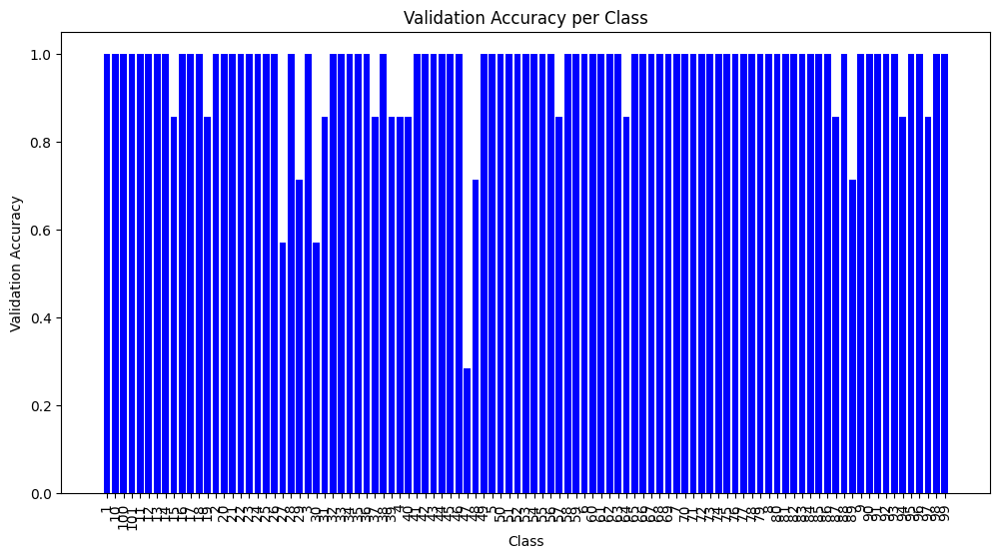


✅ Training Accuracy: 1.0000


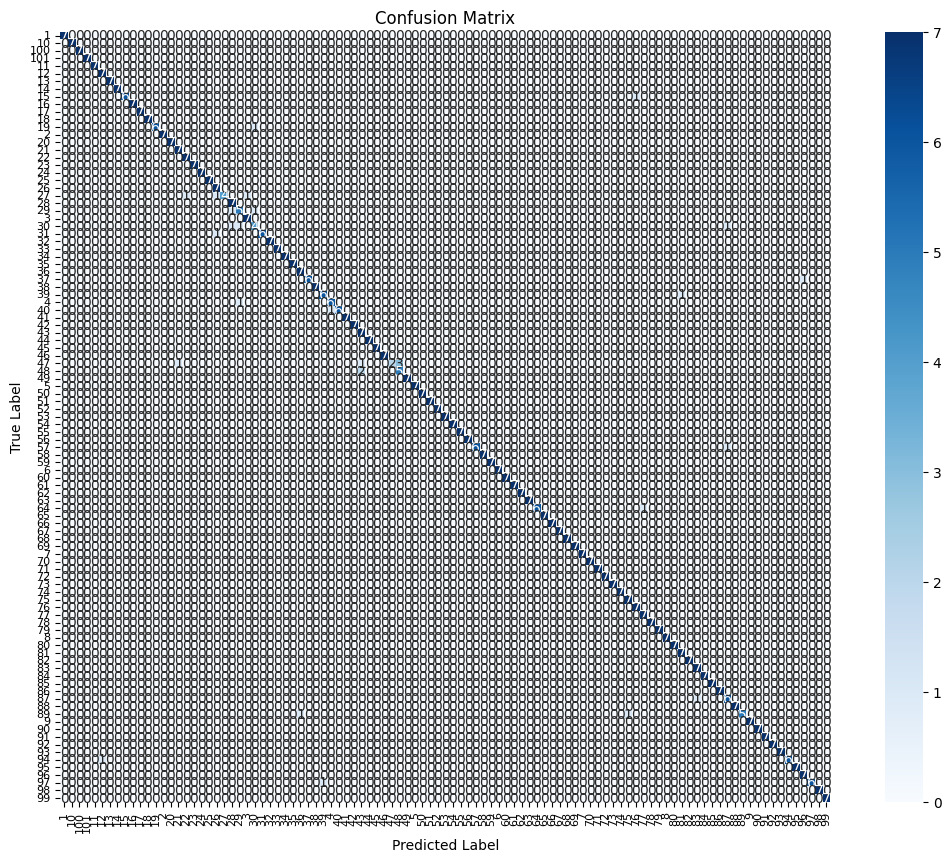

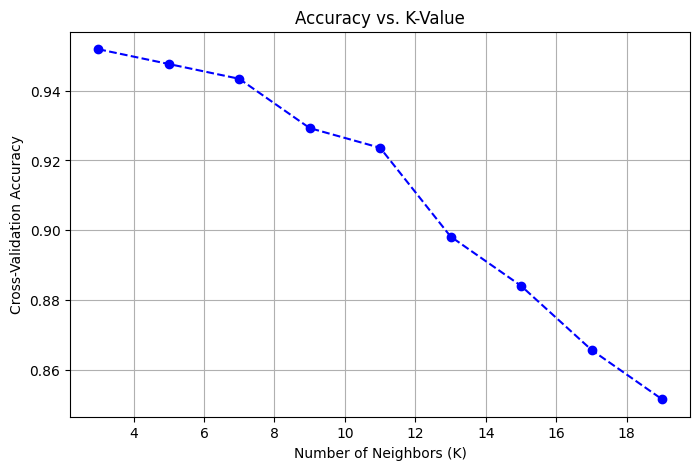

In [5]:
# Load dataset
excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
df = pd.read_excel(excel_path)

# Prepare features and labels
X = df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y = df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X (replace with column mean)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Encode class labels as numbers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Convert target names to strings (for classification report)
target_names = label_encoder.classes_

# Define KNN and parameter grid
knn = KNeighborsClassifier()
param_grid = {
    'n_neighbors': list(range(3, 21, 2)),  # Only odd values for k
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski'],
    'p': [1, 2]
}

# Stratified 7-Fold Cross-Validation
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)
grid_search = GridSearchCV(knn, param_grid, cv=skf, scoring='accuracy', n_jobs=-1)

# Run Grid Search
print("Running 7-Fold Cross-Validation with Grid Search...")
grid_search.fit(X, y_encoded)

# Get best parameters and accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("\n✅ Best Parameters for KNN:", best_params)
print(f"✅ Best Cross-Validation Accuracy: {best_score:.4f}")

# Train the best KNN model
knn_best = KNeighborsClassifier(**best_params)
knn_best.fit(X, y_encoded)

# Cross-validated predictions on full dataset
y_pred = cross_val_predict(knn_best, X, y_encoded, cv=skf)

# Generate and print classification report
print("\n📊 Classification Report:")
print(classification_report(y_encoded, y_pred, target_names=target_names))

# Compute per-class (validation) accuracy using the confusion matrix
conf_matrix = confusion_matrix(y_encoded, y_pred)
per_class_accuracy = {target_names[i]: conf_matrix[i, i] / conf_matrix[i].sum() if conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy
plt.figure(figsize=(12, 6))
plt.bar(per_class_accuracy.keys(), per_class_accuracy.values(), color='blue')
plt.xticks(rotation=90)
plt.ylabel('Validation Accuracy')
plt.xlabel('Class')
plt.title('Validation Accuracy per Class')
plt.show()

# Training Accuracy on full training data
y_train_pred = knn_best.predict(X)
train_acc = accuracy_score(y_encoded, y_train_pred)
print(f"\n✅ Training Accuracy: {train_acc:.4f}")

# Improved Confusion Matrix Plot
plt.figure(figsize=(14, 10))  # Increase figure size for better readability
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

# Accuracy vs. K-Value Plot
k_values = list(range(3, 21, 2))  # Only odd values for k
cv_scores = [np.mean(cross_val_score(KNeighborsClassifier(n_neighbors=k), X, y_encoded, cv=skf, scoring='accuracy')) for k in k_values]

plt.figure(figsize=(8, 5))
plt.plot(k_values, cv_scores, marker='o', linestyle='dashed', color='b')
plt.xlabel('Number of Neighbors (K)')
plt.ylabel('Cross-Validation Accuracy')
plt.title('Accuracy vs. K-Value')
plt.grid(True)
plt.show()

In [6]:
num_unique_classes = len(label_encoder.classes_)
print(f"Number of unique classes: {num_unique_classes}")
print(f"Encoded classes: {num_unique_classes}")  # Ensures both counts match

Number of unique classes: 101
Encoded classes: 101


## Testing the Model


📊 Classification Report for Testing Data:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
          10       1.00      0.67      0.80         3
         100       1.00      1.00      1.00         3
         101       0.67      0.67      0.67         3
          11       1.00      1.00      1.00         3
          12       0.75      1.00      0.86         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         3
          18       1.00      1.00      1.00         3
          19       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
          20       1.00      1.00      1.00         3
          21       0.75      1.00      0.86         3
          22       1.00      0.67     

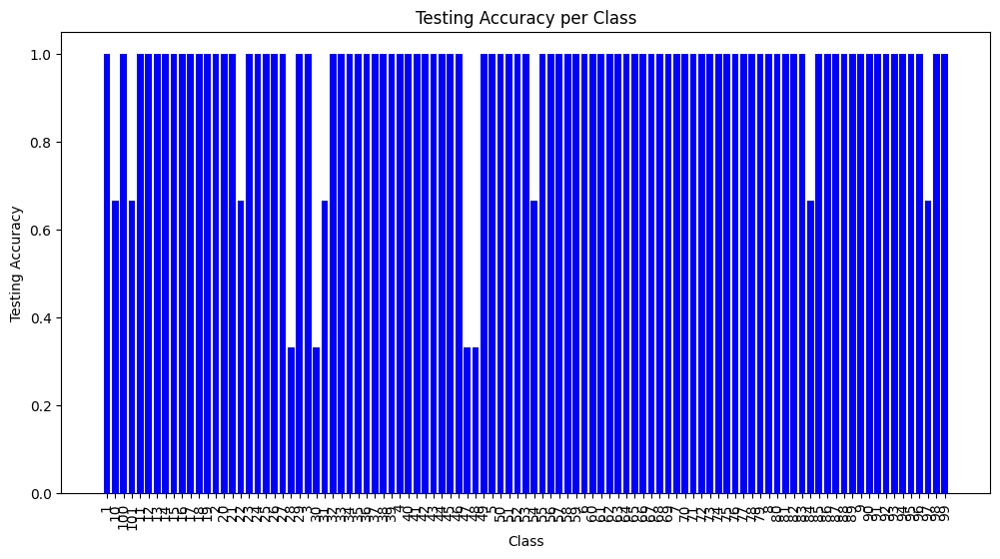


✅ Testing Accuracy: 0.9505


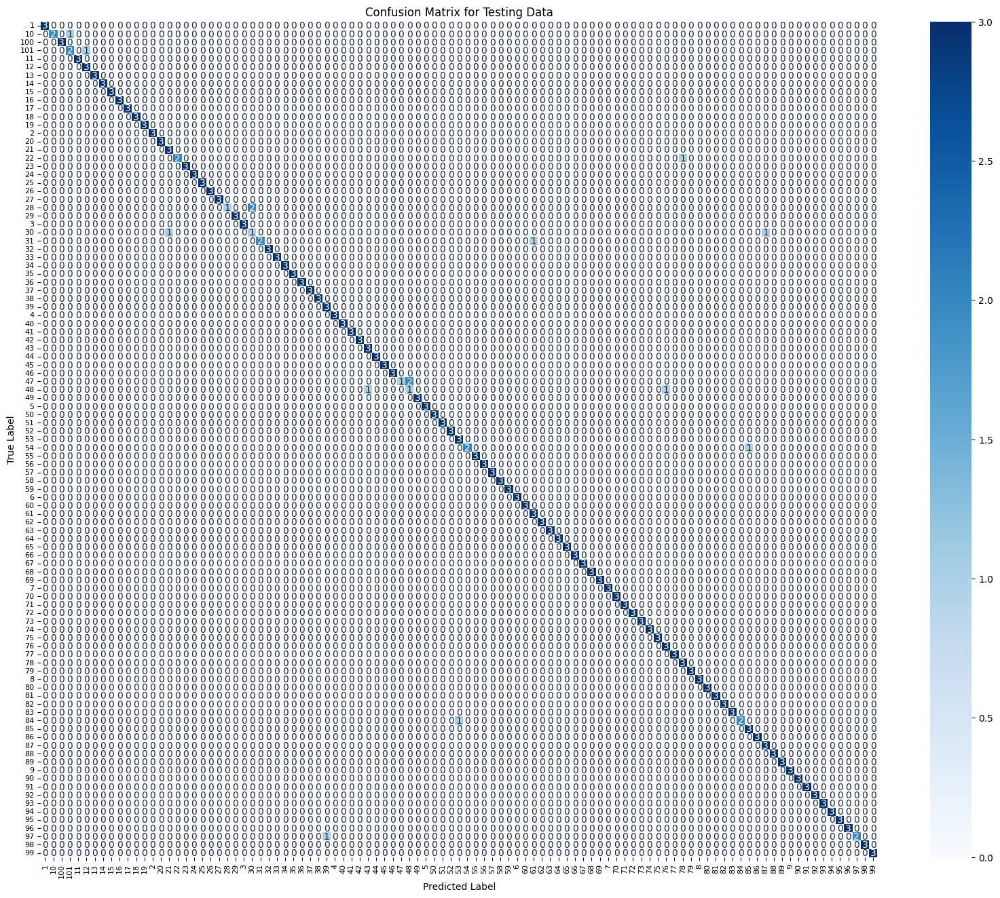

In [7]:
# Load testing dataset
test_excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")
test_df = pd.read_excel(test_excel_path)

# Prepare features and labels for testing data
X_test = test_df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y_test = test_df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X_test (replace with column mean)
X_test = imputer.transform(X_test)  # Use the same imputer as used for training data

# Encode class labels as numbers (using the same label_encoder as used for training data)
y_test_encoded = label_encoder.transform(y_test)

# Make predictions on the testing data
y_test_pred = knn_best.predict(X_test)

# Generate and print classification report for testing data
print("\n📊 Classification Report for Testing Data:")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_names))

# Compute per-class (testing) accuracy using the confusion matrix
test_conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
test_per_class_accuracy = {target_names[i]: test_conf_matrix[i, i] / test_conf_matrix[i].sum() if test_conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy for testing data
plt.figure(figsize=(12, 6))
plt.bar(test_per_class_accuracy.keys(), test_per_class_accuracy.values(), color='blue')
plt.xticks(rotation=90)
plt.ylabel('Testing Accuracy')
plt.xlabel('Class')
plt.title('Testing Accuracy per Class')
plt.show()

# Testing Accuracy
test_acc = accuracy_score(y_test_encoded, y_test_pred)
print(f"\n✅ Testing Accuracy: {test_acc:.4f}")

# Improved Confusion Matrix Plot for Testing Data
plt.figure(figsize=(20, 16))  # Increase figure size for better readability
sns.heatmap(test_conf_matrix, annot=True, cmap='Blues', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Testing Data')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Training and Testing Time

In [8]:
import time

# Measure Training Time
start_train = time.time()
knn_best.fit(X, y_encoded)  # Train the best model
end_train = time.time()
train_time = end_train - start_train
print(f"\n⏳ Training Time: {train_time:.4f} seconds")

# Measure Testing Time
start_test = time.time()
y_test_pred = knn_best.predict(X_test)  # Make predictions on test data
end_test = time.time()
test_time = end_test - start_test
print(f"\n⏳ Testing Time: {test_time:.4f} seconds")



⏳ Training Time: 0.0025 seconds

⏳ Testing Time: 0.0308 seconds


## LIME(KNN)

True Label: 47
                   Feature    Weight
0           MFCC_37 > 0.36  0.018562
1          MFCC_13 <= 0.33  0.018054
2          MFCC_12 <= 0.36  0.014408
3           MFCC_36 > 0.37  0.014338
4           MFCC_2 <= 0.38  0.012969
5           MFCC_8 <= 0.38  0.011837
6           MFCC_35 > 0.37  0.008867
7          MFCC_19 <= 0.42  0.008419
8             Pitch > 0.44  0.007841
9           MFCC_40 > 0.47  0.005643
10         MFCC_18 <= 0.39  0.005198
11   0.34 < MFCC_5 <= 0.44  0.004778
12   0.43 < MFCC_7 <= 0.52  0.004712
13          MFCC_34 > 0.35  0.004226
14  0.34 < MFCC_10 <= 0.44  0.004226
15   0.28 < MFCC_6 <= 0.41  0.003807
16         MFCC_24 <= 0.37  0.003058
17  0.46 < MFCC_15 <= 0.55  0.003021
18  0.44 < MFCC_16 <= 0.53 -0.002804
19  0.22 < MFCC_26 <= 0.29  0.002794


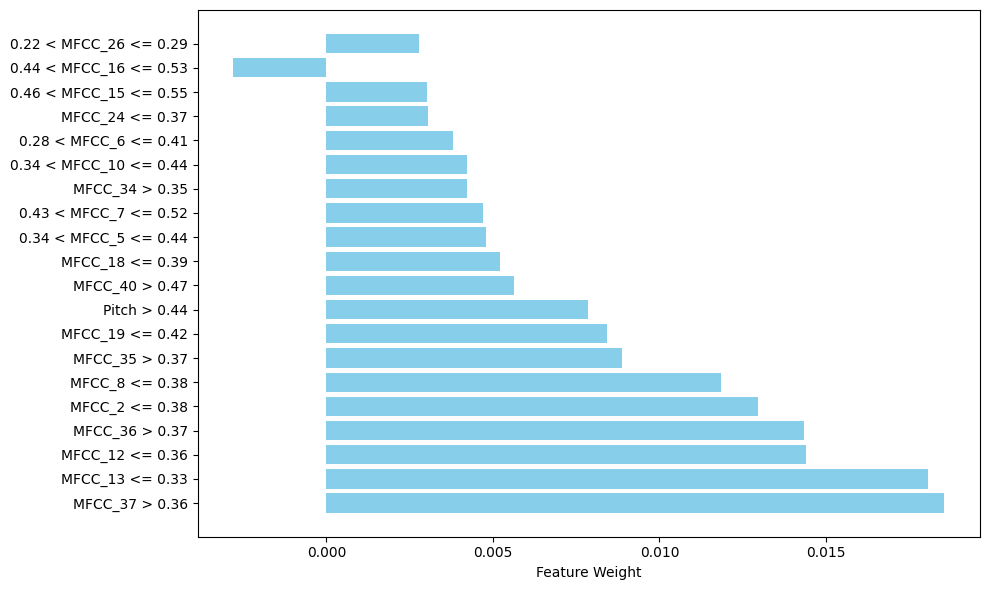

In [9]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X,  # Training data
    feature_names=df.columns[2:],  # Feature names (MFCC + Pitch features)
    class_names=target_names,  # Class names
    mode='classification',  # Mode (classification or regression)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Function to generate LIME explanation and plot bar chart
def explain_and_plot(sample_index):
    # Choose a sample from the test data to explain
    sample = X_test[sample_index]
    true_label = y_test[sample_index]

    # Print the true label
    print(f"True Label: {true_label}")

    # Get the predicted class
    predicted_class = knn_best.predict([sample])[0]  # Get the predicted class for the sample

    # Explain the prediction for the chosen sample
    explanation = explainer.explain_instance(
        data_row=sample,  # The sample to explain
        predict_fn=knn_best.predict_proba,  # Prediction function (must output probabilities)
        num_features=20,  # Number of features to include in the explanation
        top_labels=1  # Number of top predicted labels to explain
    )

    # Extract feature names and weights for the predicted class
    exp_list = explanation.as_list(label=predicted_class)  # Use the predicted class
    features, weights = zip(*exp_list)

    # Create a DataFrame for better visualization
    explanation_df = pd.DataFrame({
        'Feature': features,
        'Weight': weights
    })

    # Print the DataFrame
    print(explanation_df)

    # Create a bar plot for better visualization
    plt.figure(figsize=(10, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Feature Weight')
    plt.tight_layout()  # Improve spacing
    plt.savefig("TMFCC_LIME_KNN.png", dpi=300, bbox_inches='tight')
    plt.show()

    # Print the explanation (if using Jupyter Notebook)
    explanation.show_in_notebook()

# Example usage
sample_index = 140  # Change this to any index in the test set
explain_and_plot(sample_index)

## AUC & ROC(KNN)

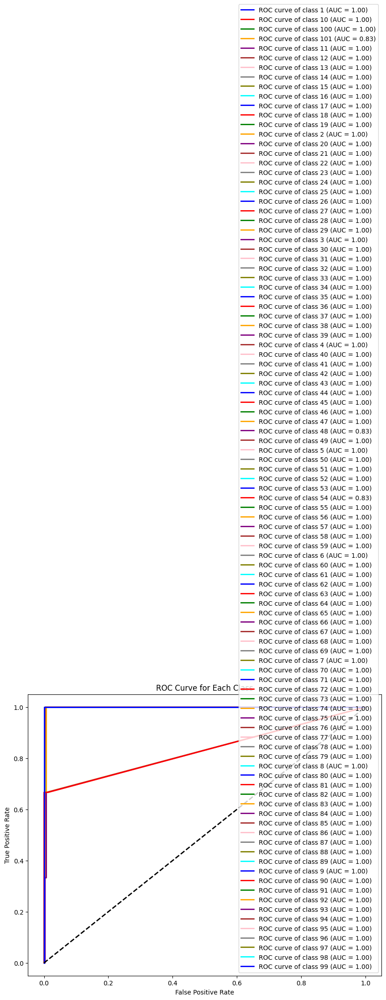

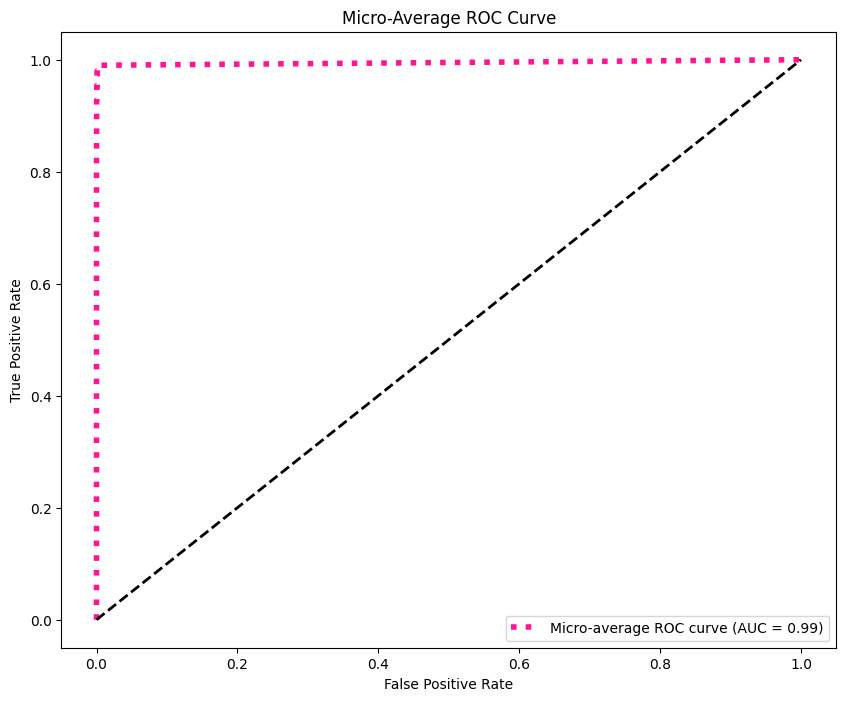

In [13]:
# Get predicted probabilities for each class
y_test_proba = knn_best.predict_proba(X_test)

# Binarize the true labels for multi-class ROC
y_test_binarized = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes = len(target_names)

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_test_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {target_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_binarized.ravel(), y_test_proba.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot micro-average ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr["micro"], tpr["micro"], label=f'Micro-average ROC curve (AUC = {roc_auc["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve')
plt.legend(loc="lower right")
plt.show()

# Random Forest

## Training the Model

Running 7-Fold Cross-Validation with Grid Search for Random Forest...

✅ Best Parameters for Random Forest: {'bootstrap': True, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
✅ Best Cross-Validation Accuracy: 0.9703

📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
          10       1.00      1.00      1.00         7
         100       0.88      1.00      0.93         7
         101       1.00      1.00      1.00         7
          11       1.00      1.00      1.00         7
          12       0.88      1.00      0.93         7
          13       1.00      1.00      1.00         7
          14       1.00      1.00      1.00         7
          15       1.00      1.00      1.00         7
          16       1.00      1.00      1.00         7
          17       1.00      1.00      1.00         7
          18       1.00      1.00      1.00         7
          19   

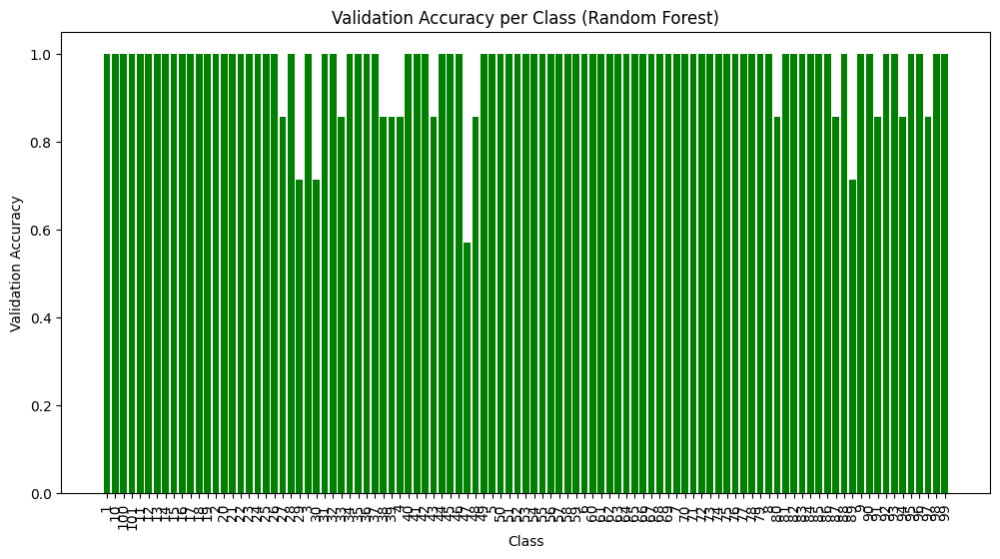


✅ Training Accuracy: 1.0000


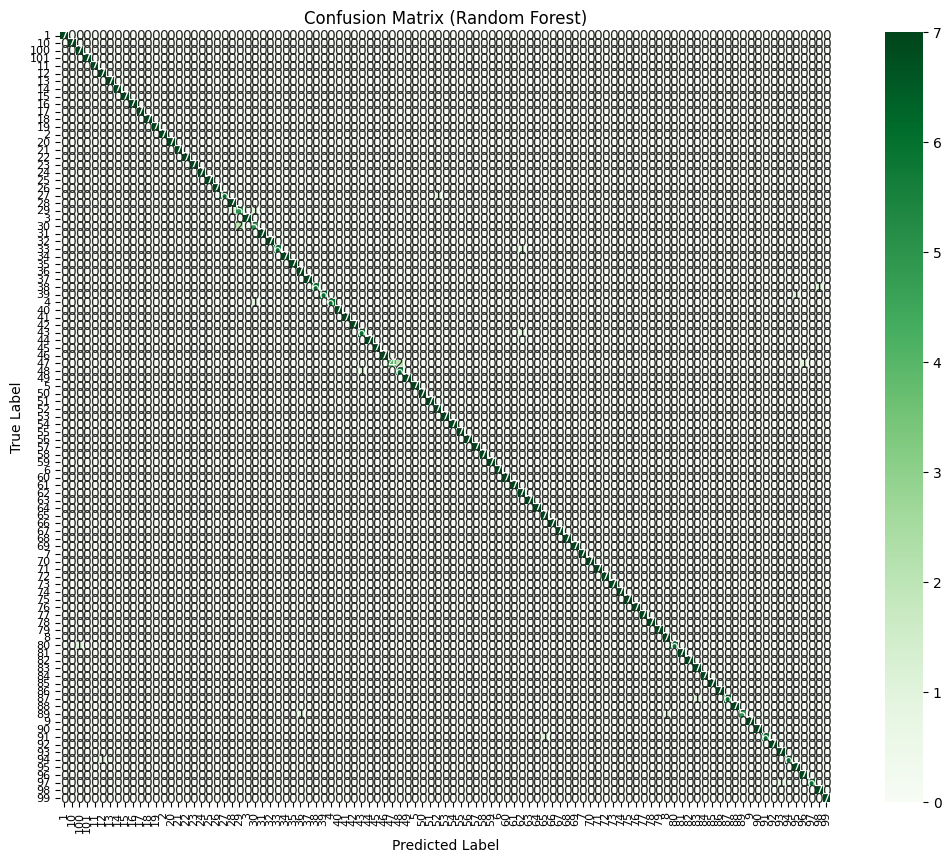

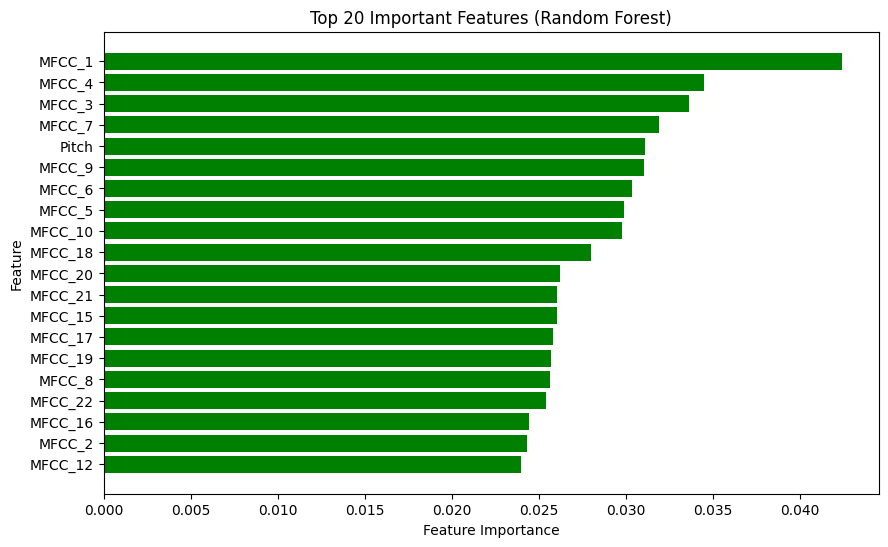

In [25]:
# Load dataset
excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
df = pd.read_excel(excel_path)

# Prepare features and labels
X = df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y = df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X (replace with column mean)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Encode class labels as numbers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Convert target names to strings (for classification report)
target_names = label_encoder.classes_

# Define Random Forest and parameter grid
rf = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200, 300],  # Number of trees
    'max_depth': [10, 20, 30, None],  # Tree depth
    'min_samples_split': [2, 5, 10],  # Minimum samples per split
    'min_samples_leaf': [1, 2, 4],  # Minimum samples per leaf
    'bootstrap': [True, False]  # Bootstrap sampling
}

# Stratified 7-Fold Cross-Validation
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)
grid_search = GridSearchCV(rf, param_grid, cv=skf, scoring='accuracy', n_jobs=-1)

# Run Grid Search
print("Running 7-Fold Cross-Validation with Grid Search for Random Forest...")
grid_search.fit(X, y_encoded)

# Get best parameters and accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("\n✅ Best Parameters for Random Forest:", best_params)
print(f"✅ Best Cross-Validation Accuracy: {best_score:.4f}")

# Train the best Random Forest model
rf_best = RandomForestClassifier(**best_params, random_state=42)
rf_best.fit(X, y_encoded)

# Cross-validated predictions on full dataset
y_pred = cross_val_predict(rf_best, X, y_encoded, cv=skf)

# Generate and print classification report
print("\n📊 Classification Report:")
print(classification_report(y_encoded, y_pred, target_names=target_names))

# Compute per-class (validation) accuracy using the confusion matrix
conf_matrix = confusion_matrix(y_encoded, y_pred)
per_class_accuracy = {target_names[i]: conf_matrix[i, i] / conf_matrix[i].sum() if conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy
plt.figure(figsize=(12, 6))
plt.bar(per_class_accuracy.keys(), per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Validation Accuracy')
plt.xlabel('Class')
plt.title('Validation Accuracy per Class (Random Forest)')
plt.show()

# Training Accuracy on full training data
y_train_pred = rf_best.predict(X)
train_acc = accuracy_score(y_encoded, y_train_pred)
print(f"\n✅ Training Accuracy: {train_acc:.4f}")

# Improved Confusion Matrix Plot
plt.figure(figsize=(14, 10))  # Increase figure size for better readability
sns.heatmap(conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Random Forest)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

# Feature Importance Plot
feature_importances = rf_best.feature_importances_
sorted_idx = np.argsort(feature_importances)[-20:]  # Top 20 important features

plt.figure(figsize=(10, 6))
plt.barh(np.array(df.columns[2:])[sorted_idx], feature_importances[sorted_idx], color='green')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Top 20 Important Features (Random Forest)')
plt.show()

### Testing


📊 Classification Report for Testing Data:
              precision    recall  f1-score   support

           1       1.00      0.67      0.80         3
          10       1.00      1.00      1.00         3
         100       1.00      1.00      1.00         3
         101       1.00      0.67      0.80         3
          11       1.00      1.00      1.00         3
          12       0.75      1.00      0.86         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         3
          18       0.67      0.67      0.67         3
          19       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
          20       1.00      1.00      1.00         3
          21       0.75      1.00      0.86         3
          22       1.00      0.67     

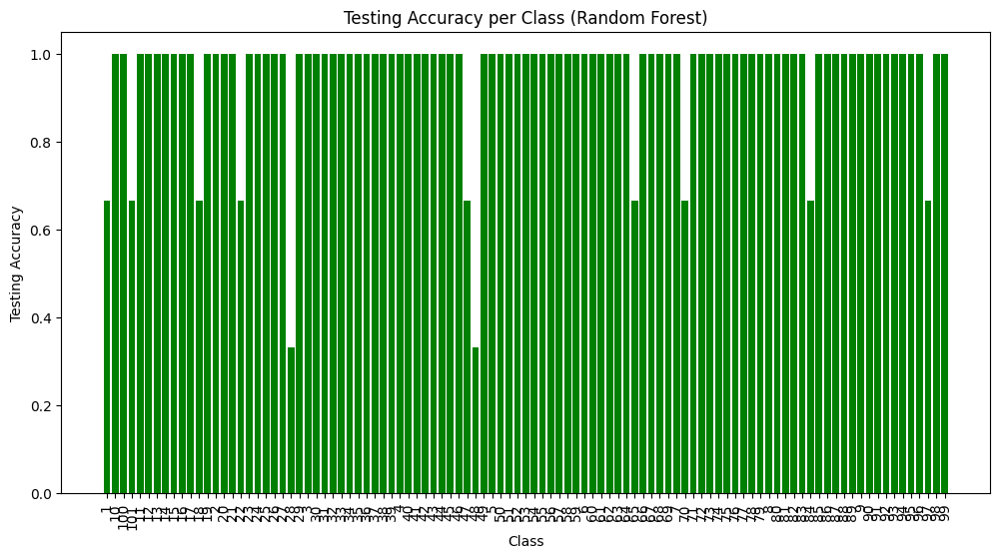


✅ Testing Accuracy: 0.9571


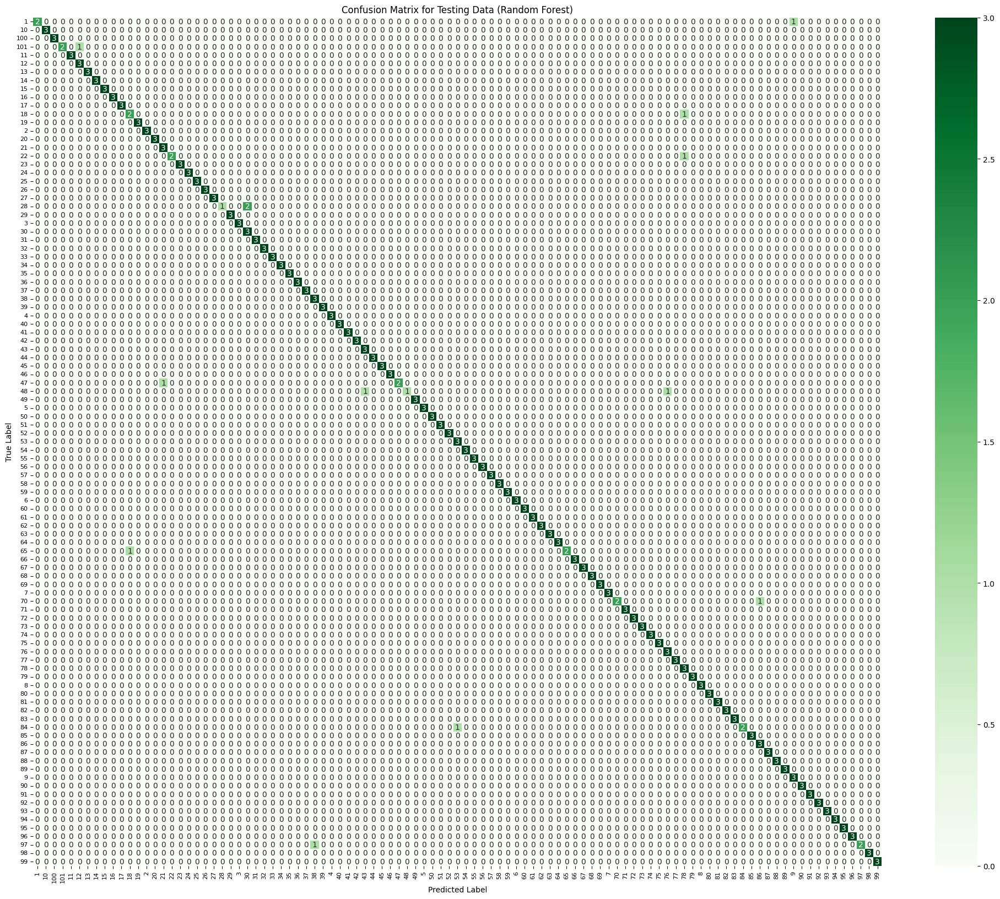

In [26]:
# Load testing dataset
test_excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")
test_df = pd.read_excel(test_excel_path)

# Prepare features and labels for testing data
X_test = test_df.iloc[:, 2:].values
y_test = test_df.iloc[:, 0].astype(str).values

# Handle NaN values in X_test (replace with column mean)
X_test = imputer.transform(X_test)

# Encode class labels as numbers
y_test_encoded = label_encoder.transform(y_test)

# Make predictions on the testing data
y_test_pred = rf_best.predict(X_test)

# Generate and print classification report for testing data
print("\n📊 Classification Report for Testing Data:")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_names))

# Compute per-class (testing) accuracy using the confusion matrix
test_conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
test_per_class_accuracy = {target_names[i]: test_conf_matrix[i, i] / test_conf_matrix[i].sum() if test_conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy for testing data
plt.figure(figsize=(12, 6))
plt.bar(test_per_class_accuracy.keys(), test_per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Testing Accuracy')
plt.xlabel('Class')
plt.title('Testing Accuracy per Class (Random Forest)')
plt.show()

# Testing Accuracy
test_acc = accuracy_score(y_test_encoded, y_test_pred)
print(f"\n✅ Testing Accuracy: {test_acc:.4f}")

# Improved Confusion Matrix Plot for Testing Data
plt.figure(figsize=(25, 20))
sns.heatmap(test_conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Testing Data (Random Forest)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Training and Testing Time

In [1]:
import time

# Measure Training Time
start_train = time.time()
rf_best.fit(X, y_encoded)  # Train the best model
end_train = time.time()
train_time = end_train - start_train
print(f"\n⏳ Training Time: {train_time:.4f} seconds")

# Measure Testing Time
start_test = time.time()
y_test_pred = rf_best.predict(X_test)  # Make predictions on test data
end_test = time.time()
test_time = end_test - start_test
print(f"\n⏳ Testing Time: {test_time:.4f} seconds")


NameError: name 'rf_best' is not defined

# LIME(RF)

True Label: 47
                   Feature    Weight
0          MFCC_19 <= 0.42  0.005641
1           MFCC_40 > 0.47  0.005140
2          MFCC_18 <= 0.39  0.005063
3           MFCC_1 <= 0.46  0.002915
4          MFCC_12 <= 0.36  0.002663
5          MFCC_13 <= 0.33  0.002462
6           MFCC_35 > 0.37  0.001982
7           MFCC_8 <= 0.38  0.001905
8           MFCC_37 > 0.36  0.001302
9    0.28 < MFCC_6 <= 0.41  0.001287
10   0.46 < MFCC_4 <= 0.57  0.001266
11          MFCC_2 <= 0.38  0.001102
12  0.46 < MFCC_15 <= 0.55  0.001071
13  0.34 < MFCC_10 <= 0.44  0.001062
14   0.41 < MFCC_9 <= 0.50  0.001058
15          MFCC_36 > 0.37  0.000986
16          MFCC_34 > 0.35  0.000906
17   0.67 < MFCC_3 <= 0.75  0.000879
18   0.34 < MFCC_5 <= 0.44  0.000852
19            Pitch > 0.44 -0.000619


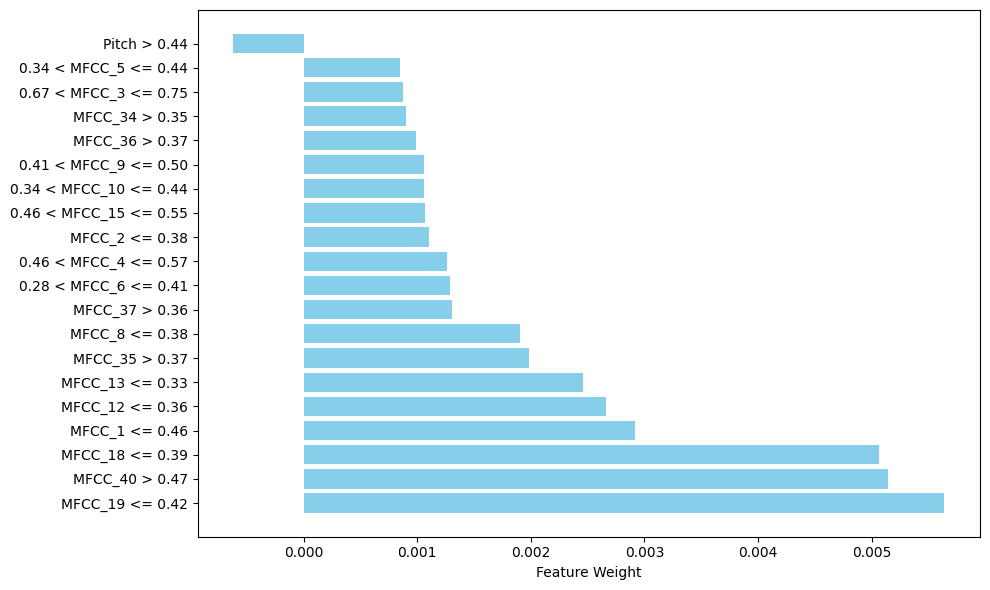

In [28]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X,  # Training data
    feature_names=df.columns[2:],  # Feature names (MFCC + Pitch features)
    class_names=target_names,  # Class names
    mode='classification',  # Mode (classification or regression)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Function to generate LIME explanation and plot bar chart
def explain_and_plot(sample_index):
    # Choose a sample from the test data to explain
    sample = X_test[sample_index]
    true_label = y_test[sample_index]

    # Print the true label
    print(f"True Label: {true_label}")

    # Get the predicted class
    predicted_class = rf_best.predict([sample])[0]  # Get the predicted class for the sample

    # Explain the prediction for the chosen sample
    explanation = explainer.explain_instance(
        data_row=sample,  # The sample to explain
        predict_fn=rf_best.predict_proba,  # Prediction function (must output probabilities)
        num_features=20,  # Number of features to include in the explanation
        top_labels=1  # Number of top predicted labels to explain
    )

    # Extract feature names and weights for the predicted class
    exp_list = explanation.as_list(label=predicted_class)  # Use the predicted class
    features, weights = zip(*exp_list)

    # Create a DataFrame for better visualization
    explanation_df = pd.DataFrame({
        'Feature': features,
        'Weight': weights
    })

    # Print the DataFrame
    print(explanation_df)

    # Create a bar plot for better visualization
    plt.figure(figsize=(10, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Feature Weight')
    plt.tight_layout()  # Improve spacing
    plt.savefig("TMFCC_LIME_RF.png", dpi=300, bbox_inches='tight')
    plt.show()

    # Print the explanation (if using Jupyter Notebook)
    explanation.show_in_notebook()

# Example usage
sample_index = 140  # Change this to any index in the test set
explain_and_plot(sample_index)

### AUC And ROC

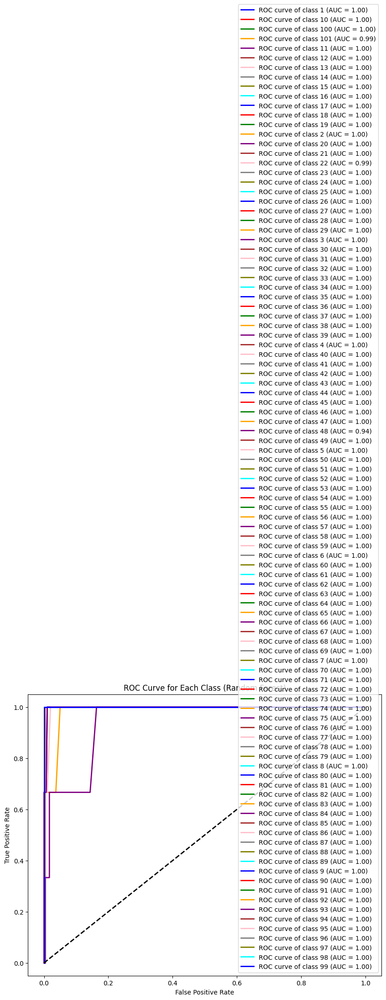

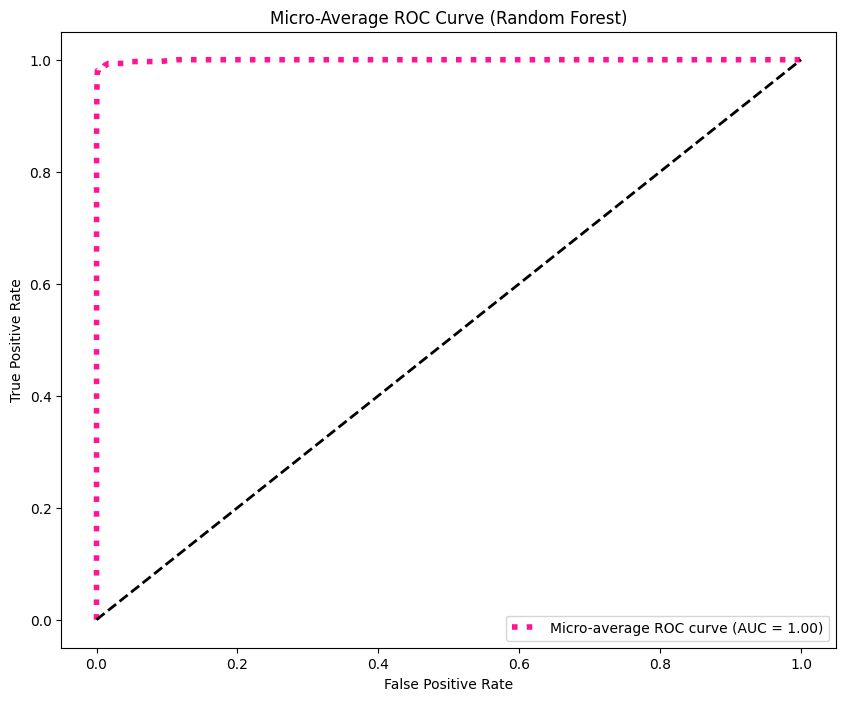

In [15]:
# Get predicted probabilities for each class
y_test_proba_rf = rf_best.predict_proba(X_test)

# Binarize the true labels for multi-class ROC
y_test_binarized_rf = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

# Compute ROC curve and ROC area for each class
fpr_rf = dict()
tpr_rf = dict()
roc_auc_rf = dict()
n_classes = len(target_names)

for i in range(n_classes):
    fpr_rf[i], tpr_rf[i], _ = roc_curve(y_test_binarized_rf[:, i], y_test_proba_rf[:, i])
    roc_auc_rf[i] = auc(fpr_rf[i], tpr_rf[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_rf[i], tpr_rf[i], color=color, lw=2,
             label=f'ROC curve of class {target_names[i]} (AUC = {roc_auc_rf[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class (Random Forest)')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and AUC
fpr_rf["micro"], tpr_rf["micro"], _ = roc_curve(y_test_binarized_rf.ravel(), y_test_proba_rf.ravel())
roc_auc_rf["micro"] = auc(fpr_rf["micro"], tpr_rf["micro"])

# Plot micro-average ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_rf["micro"], tpr_rf["micro"], label=f'Micro-average ROC curve (AUC = {roc_auc_rf["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve (Random Forest)')
plt.legend(loc="lower right")
plt.show()

# MLP

## Training

Running 7-Fold Cross-Validation with Grid Search for MLP...

✅ Best Parameters for MLP: {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}
✅ Best Cross-Validation Accuracy: 0.9646

📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
          10       1.00      1.00      1.00         7
         100       1.00      1.00      1.00         7
         101       0.88      1.00      0.93         7
          11       1.00      1.00      1.00         7
          12       0.88      1.00      0.93         7
          13       1.00      1.00      1.00         7
          14       1.00      1.00      1.00         7
          15       1.00      1.00      1.00         7
          16       1.00      1.00      1.00         7
          17       1.00      1.00      1.00         7
          18       1.00      1.00      1.00         7
          19       1.00   

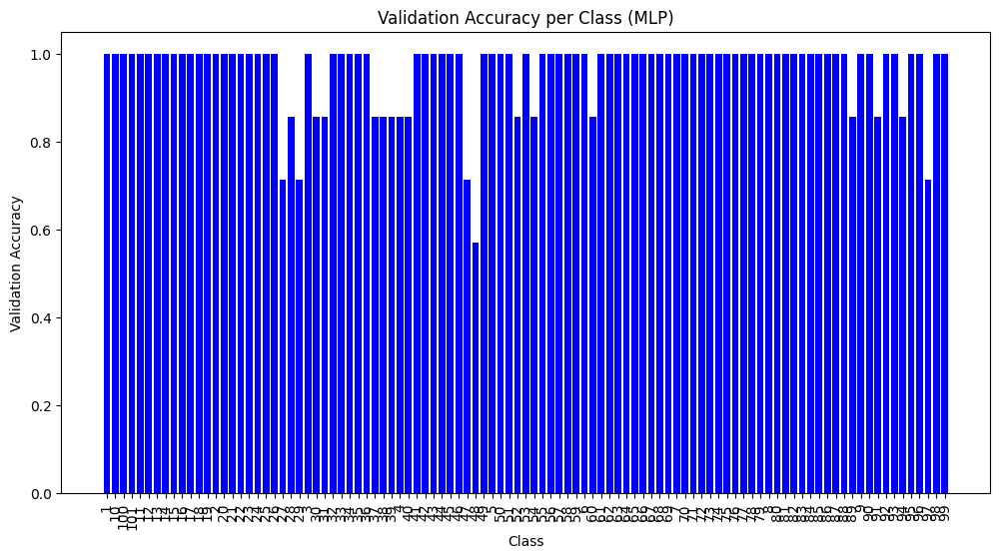


✅ Training Accuracy: 1.0000


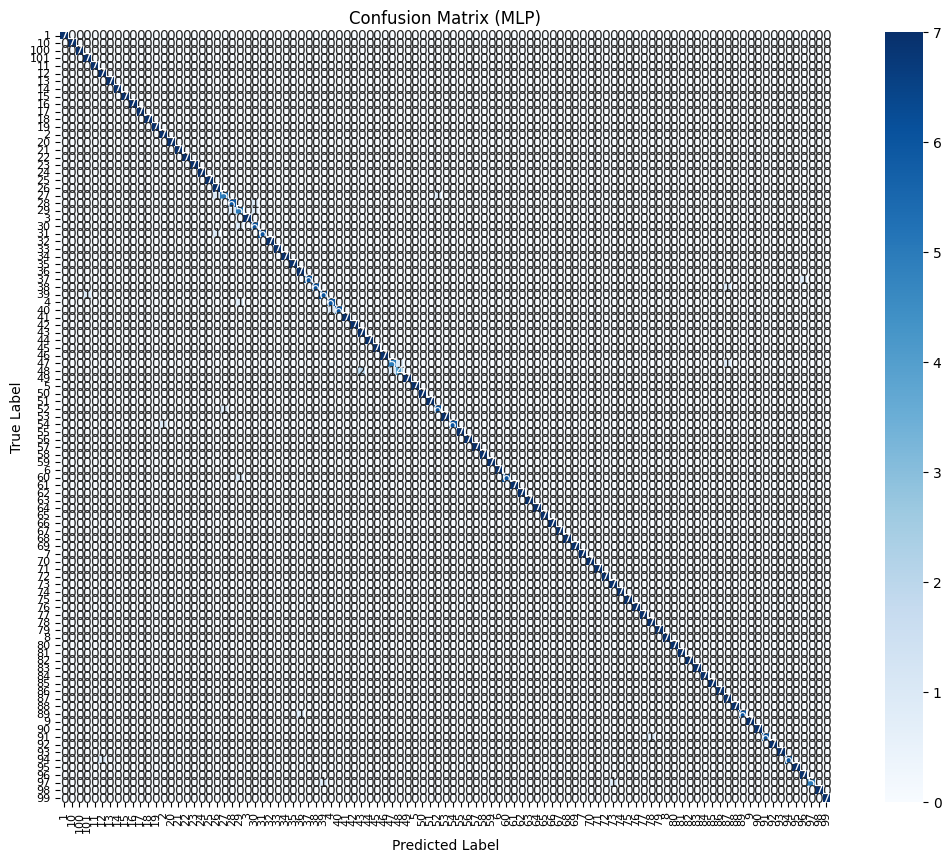

In [18]:
# Load dataset
excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
df = pd.read_excel(excel_path)

# Prepare features and labels
X = df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y = df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X (replace with column mean)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Encode class labels as numbers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

target_names = label_encoder.classes_

# Define MLP and parameter grid
mlp = MLPClassifier(max_iter=2000, random_state=42)
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50), (200, 100)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

# Stratified 7-Fold Cross-Validation
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)
grid_search = GridSearchCV(mlp, param_grid, cv=skf, scoring='accuracy', n_jobs=-1)

# Run Grid Search
print("Running 7-Fold Cross-Validation with Grid Search for MLP...")
grid_search.fit(X, y_encoded)

# Get best parameters and accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("\n✅ Best Parameters for MLP:", best_params)
print(f"✅ Best Cross-Validation Accuracy: {best_score:.4f}")

# Train the best MLP model
mlp_best = MLPClassifier(**best_params, max_iter=2000, random_state=42)
mlp_best.fit(X, y_encoded)

# Cross-validated predictions on full dataset
y_pred = cross_val_predict(mlp_best, X, y_encoded, cv=skf)

# Generate and print classification report
print("\n📊 Classification Report:")
print(classification_report(y_encoded, y_pred, target_names=target_names))

# Compute per-class accuracy using confusion matrix
conf_matrix = confusion_matrix(y_encoded, y_pred)
per_class_accuracy = {target_names[i]: conf_matrix[i, i] / conf_matrix[i].sum() if conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy
plt.figure(figsize=(12, 6))
plt.bar(per_class_accuracy.keys(), per_class_accuracy.values(), color='blue')
plt.xticks(rotation=90)
plt.ylabel('Validation Accuracy')
plt.xlabel('Class')
plt.title('Validation Accuracy per Class (MLP)')
plt.show()

# Training Accuracy on full training data
y_train_pred = mlp_best.predict(X)
train_acc = accuracy_score(y_encoded, y_train_pred)
print(f"\n✅ Training Accuracy: {train_acc:.4f}")

# Improved Confusion Matrix Plot
plt.figure(figsize=(14, 10))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (MLP)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Testing


📊 Classification Report for Testing Data:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
         100       1.00      1.00      1.00         3
         101       1.00      0.67      0.80         3
          11       1.00      1.00      1.00         3
          12       1.00      1.00      1.00         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         3
          18       1.00      1.00      1.00         3
          19       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
          20       1.00      1.00      1.00         3
          21       1.00      1.00      1.00         3
          22       1.00      1.00     

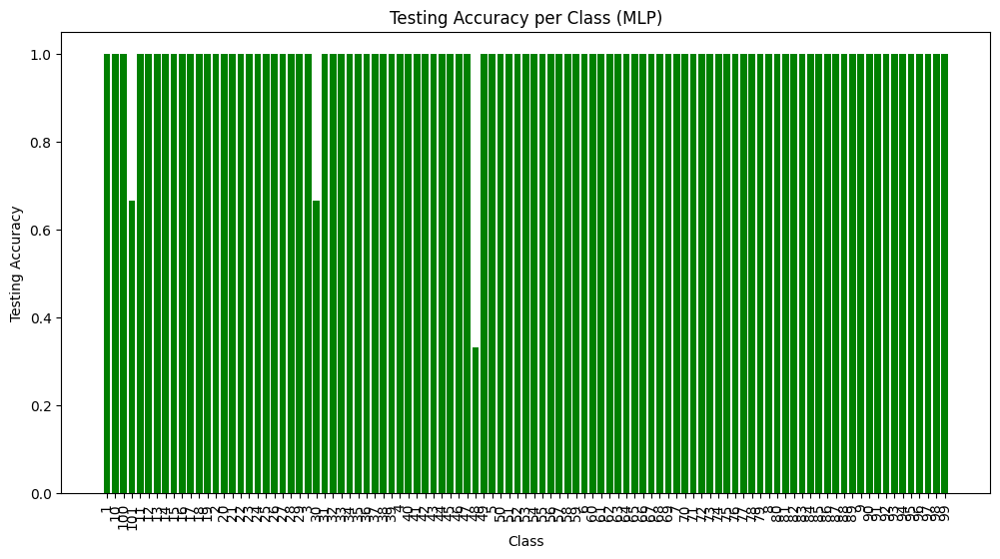


✅ Testing Accuracy: 0.9868


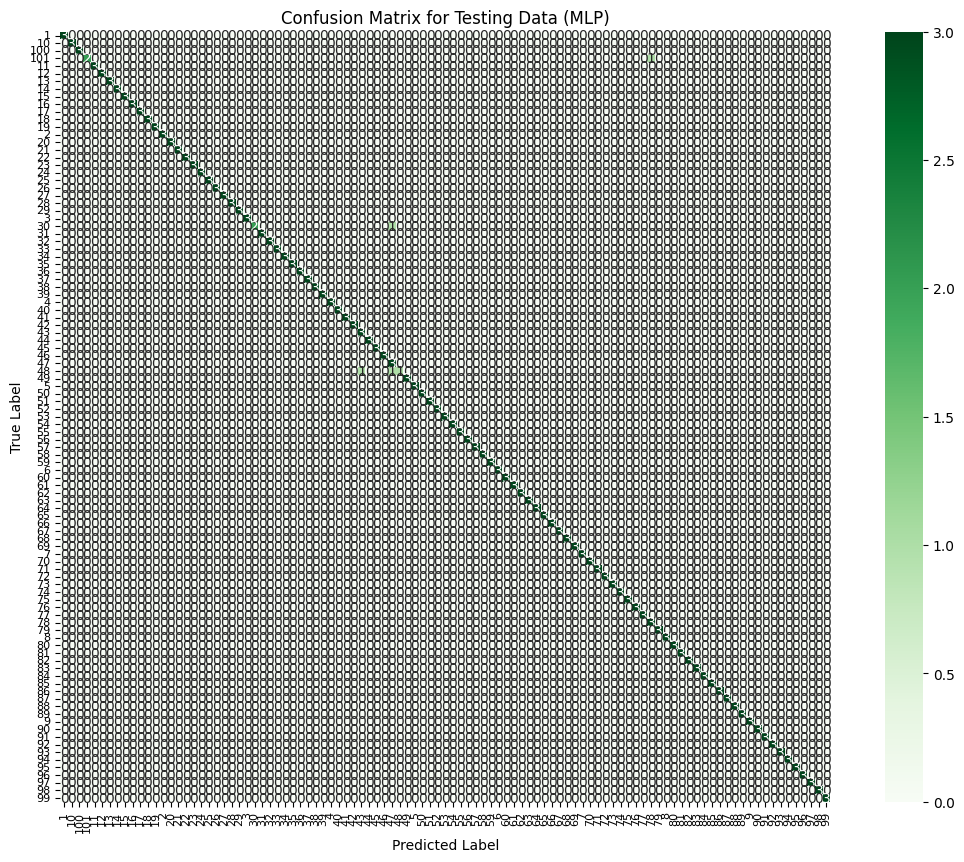

In [19]:
# Load testing dataset
test_excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")
test_df = pd.read_excel(test_excel_path)

# Prepare features and labels for testing data
X_test = test_df.iloc[:, 2:].values
y_test = test_df.iloc[:, 0].astype(str).values  # Class labels (folder names)

# Handle NaN values in X_test (replace with column mean)
X_test = imputer.transform(X_test)

# Encode class labels as numbers
y_test_encoded = label_encoder.transform(y_test)

# Make predictions on the testing data
y_test_pred = mlp_best.predict(X_test)

# Generate and print classification report for testing data
print("\n📊 Classification Report for Testing Data:")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_names))

# Compute per-class (testing) accuracy using the confusion matrix
test_conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
test_per_class_accuracy = {
    target_names[i]: test_conf_matrix[i, i] / test_conf_matrix[i].sum() if test_conf_matrix[i].sum() > 0 else 0.0
    for i in range(len(target_names))
}

# Plot per-class accuracy for testing data
plt.figure(figsize=(12, 6))
plt.bar(test_per_class_accuracy.keys(), test_per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Testing Accuracy')
plt.xlabel('Class')
plt.title('Testing Accuracy per Class (MLP)')
plt.show()

# Overall Testing Accuracy
test_acc = accuracy_score(y_test_encoded, y_test_pred)
print(f"\n✅ Testing Accuracy: {test_acc:.4f}")

# Improved Confusion Matrix Plot for Testing Data
plt.figure(figsize=(14, 10))
sns.heatmap(test_conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Testing Data (MLP)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

# Testing and Training Time

In [12]:
import time

# Measure Training Time
start_train = time.time()
mlp_best.fit(X, y_encoded)  # Train the best model
end_train = time.time()
train_time = end_train - start_train
print(f"\n⏳ Training Time: {train_time:.4f} seconds")

# Measure Testing Time
start_test = time.time()
y_test_pred = mlp_best.predict(X_test)  # Make predictions on test data
end_test = time.time()
test_time = end_test - start_test
print(f"\n⏳ Testing Time: {test_time:.4f} seconds")



⏳ Training Time: 6.2235 seconds

⏳ Testing Time: 0.0037 seconds


## LIME(MLP)

True Label: 47
                   Feature    Weight
0          MFCC_19 <= 0.42  0.046331
1          MFCC_18 <= 0.39  0.031858
2           MFCC_40 > 0.47  0.027669
3           MFCC_8 <= 0.38  0.023688
4             Pitch > 0.44  0.021255
5           MFCC_35 > 0.37  0.019088
6           MFCC_1 <= 0.46  0.018903
7           MFCC_34 > 0.35  0.017177
8          MFCC_12 <= 0.36  0.017071
9           MFCC_2 <= 0.38  0.017027
10         MFCC_24 <= 0.37 -0.011131
11         MFCC_28 <= 0.26  0.011016
12          MFCC_33 > 0.33  0.008892
13          MFCC_37 > 0.36  0.008121
14  0.46 < MFCC_20 <= 0.54  0.007702
15         MFCC_29 <= 0.23  0.006939
16   0.43 < MFCC_7 <= 0.52  0.006937
17  0.46 < MFCC_15 <= 0.55  0.006806
18  0.40 < MFCC_17 <= 0.50 -0.006600
19  0.44 < MFCC_16 <= 0.53  0.006079


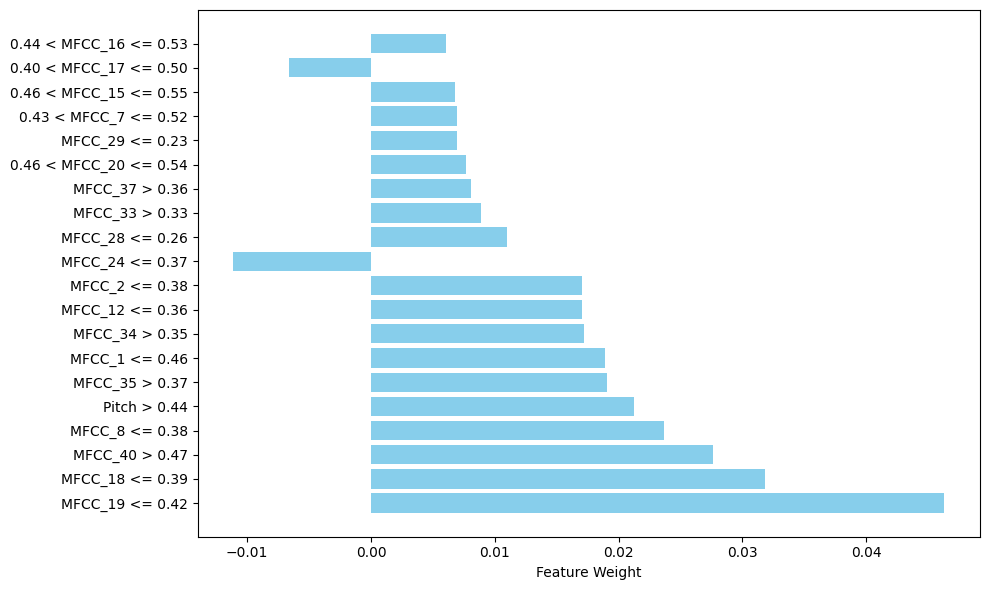

In [14]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X,  # Training data
    feature_names=df.columns[2:],  # Feature names (MFCC + Pitch features)
    class_names=target_names,  # Class names
    mode='classification',  # Mode (classification or regression)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Function to generate LIME explanation and plot bar chart
def explain_and_plot(sample_index):
    # Choose a sample from the test data to explain
    sample = X_test[sample_index]
    true_label = y_test[sample_index]

    # Print the true label
    print(f"True Label: {true_label}")

    # Get the predicted class
    predicted_class = mlp_best.predict([sample])[0]  # Get the predicted class for the sample

    # Explain the prediction for the chosen sample
    explanation = explainer.explain_instance(
        data_row=sample,  # The sample to explain
        predict_fn=mlp_best.predict_proba,  # Prediction function (must output probabilities)
        num_features=20,  # Number of features to include in the explanation
        top_labels=1  # Number of top predicted labels to explain
    )

    # Extract feature names and weights for the predicted class
    exp_list = explanation.as_list(label=predicted_class)  # Use the predicted class
    features, weights = zip(*exp_list)

    # Create a DataFrame for better visualization
    explanation_df = pd.DataFrame({
        'Feature': features,
        'Weight': weights
    })

    # Print the DataFrame
    print(explanation_df)

    # Create a bar plot for better visualization
    plt.figure(figsize=(10, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Feature Weight')
    plt.tight_layout()  # Improve spacing
    plt.savefig("TMFCC_LIME_MLP.png", dpi=300, bbox_inches='tight')
    plt.show()

    # Print the explanation (if using Jupyter Notebook)
    explanation.show_in_notebook()

# Example usage
sample_index = 140  # Change this to any index in the test set
explain_and_plot(sample_index)

## AUC And ROC Curve

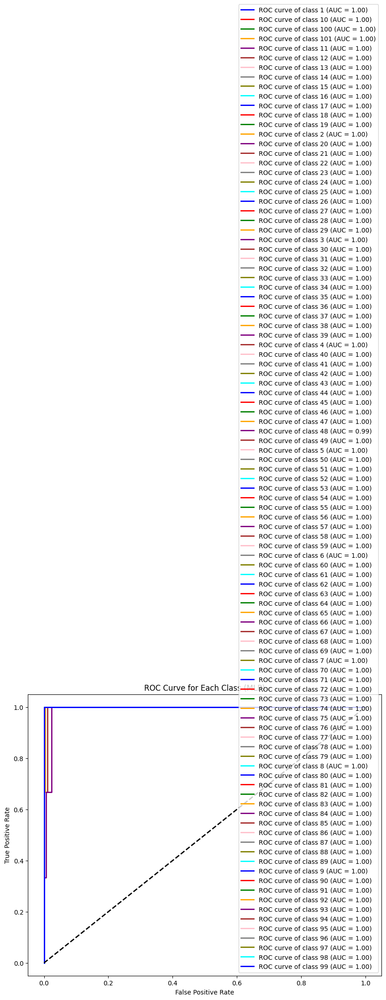

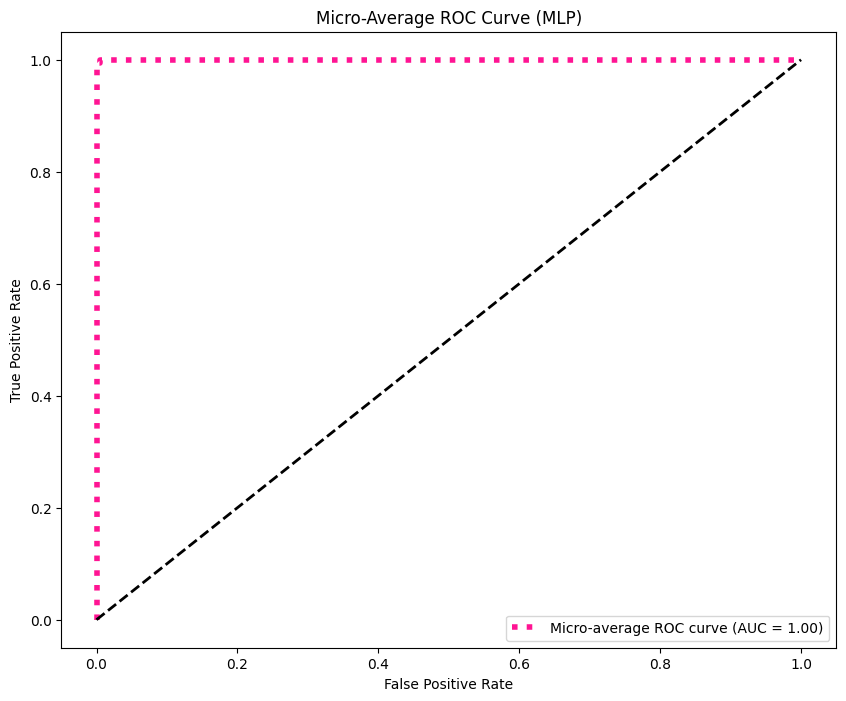

In [20]:
# Get predicted probabilities for each class (MLP model)
y_test_proba_mlp = mlp_best.predict_proba(X_test)

# Binarize the true labels for multi-class ROC
y_test_binarized_mlp = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

# Compute ROC curve and AUC for each class
fpr_mlp = dict()
tpr_mlp = dict()
roc_auc_mlp = dict()
n_classes = len(target_names)

for i in range(n_classes):
    fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_binarized_mlp[:, i], y_test_proba_mlp[:, i])
    roc_auc_mlp[i] = auc(fpr_mlp[i], tpr_mlp[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_mlp[i], tpr_mlp[i], color=color, lw=2,
             label=f'ROC curve of class {target_names[i]} (AUC = {roc_auc_mlp[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class (MLP)')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and AUC
fpr_mlp["micro"], tpr_mlp["micro"], _ = roc_curve(y_test_binarized_mlp.ravel(), y_test_proba_mlp.ravel())
roc_auc_mlp["micro"] = auc(fpr_mlp["micro"], tpr_mlp["micro"])

# Plot micro-average ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_mlp["micro"], tpr_mlp["micro"], label=f'Micro-average ROC curve (AUC = {roc_auc_mlp["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve (MLP)')
plt.legend(loc="lower right")
plt.show()

# SVM

## Training

Running 7-Fold Cross-Validation with Grid Search for SVM...

✅ Best Parameters for SVM: {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
✅ Best Cross-Validation Accuracy: 0.9745

📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         7
          10       1.00      1.00      1.00         7
         100       1.00      1.00      1.00         7
         101       1.00      1.00      1.00         7
          11       1.00      1.00      1.00         7
          12       1.00      1.00      1.00         7
          13       1.00      1.00      1.00         7
          14       1.00      1.00      1.00         7
          15       1.00      1.00      1.00         7
          16       1.00      1.00      1.00         7
          17       1.00      1.00      1.00         7
          18       1.00      1.00      1.00         7
          19       1.00      1.00      1.00         7
           2       1.00      1.00      1.

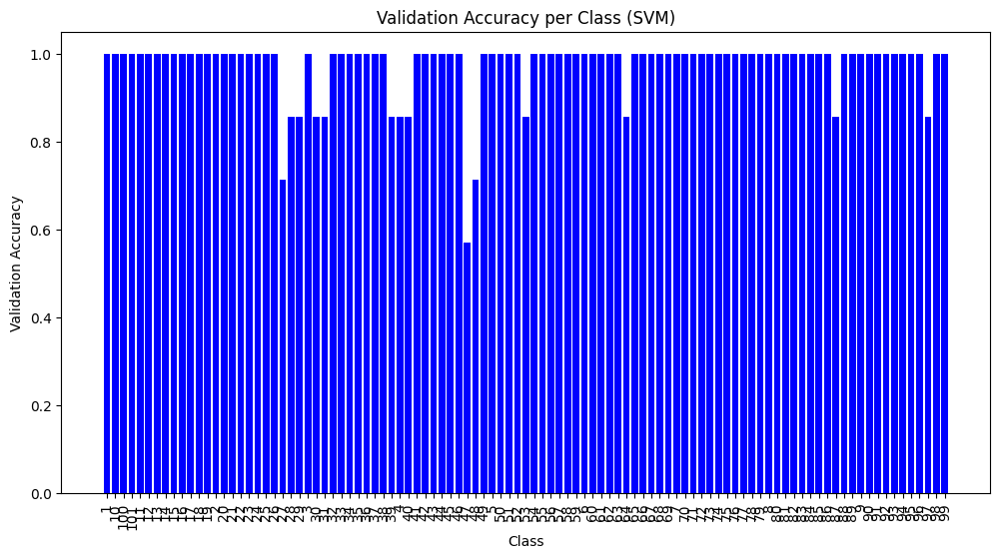


✅ Training Accuracy: 1.0000


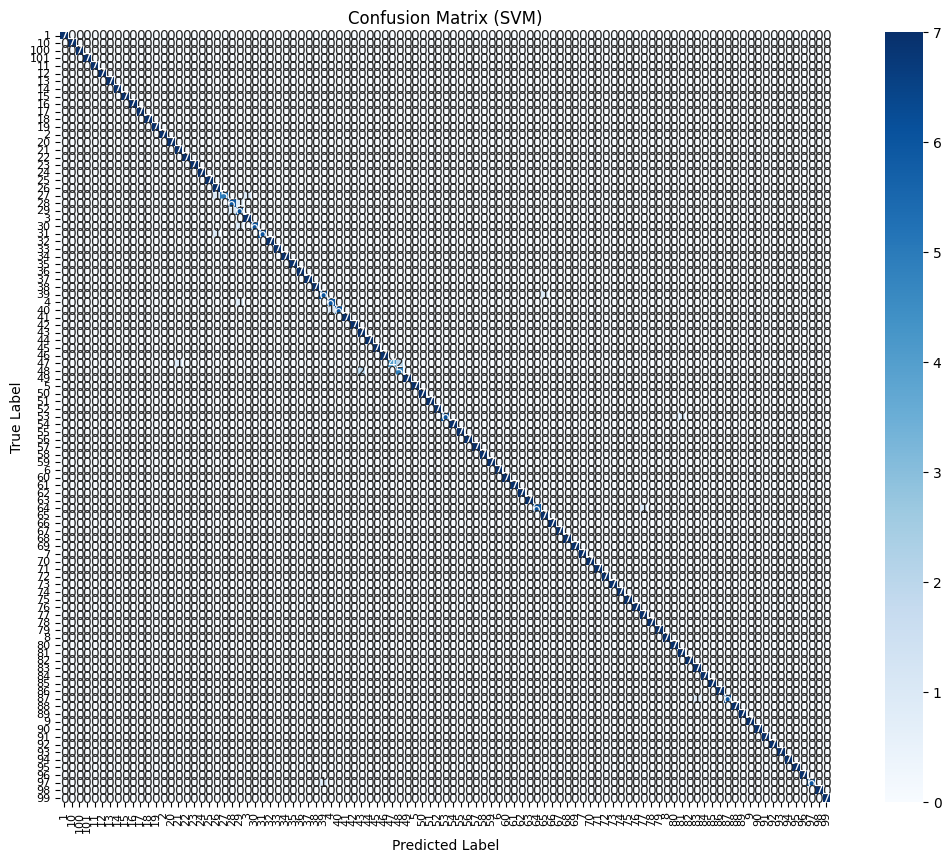

In [22]:
# Load dataset
excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
df = pd.read_excel(excel_path)

# Prepare features and labels
X = df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y = df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X (replace with column mean)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Encode class labels as numbers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Convert target names to strings (for classification report)
target_names = label_encoder.classes_

# Standardize features (SVM is sensitive to feature scales)
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Define SVM and parameter grid
svm = SVC(probability=True, random_state=42)

param_grid = {
    'C': [0.1, 1, 10, 100],  # Regularization parameter
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],  # Kernel types
    'gamma': ['scale', 'auto']  # Kernel coefficient
}

# Stratified 7-Fold Cross-Validation
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)
grid_search = GridSearchCV(svm, param_grid, cv=skf, scoring='accuracy', n_jobs=-1)

# Run Grid Search
print("Running 7-Fold Cross-Validation with Grid Search for SVM...")
grid_search.fit(X, y_encoded)

# Get best parameters and accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("\n✅ Best Parameters for SVM:", best_params)
print(f"✅ Best Cross-Validation Accuracy: {best_score:.4f}")

# Train the best SVM model
svm_best = SVC(**best_params, probability=True, random_state=42)
svm_best.fit(X, y_encoded)

# Cross-validated predictions on full dataset
y_pred = cross_val_predict(svm_best, X, y_encoded, cv=skf)

# Generate and print classification report
print("\n📊 Classification Report:")
print(classification_report(y_encoded, y_pred, target_names=target_names))

# Compute per-class (validation) accuracy using the confusion matrix
conf_matrix = confusion_matrix(y_encoded, y_pred)
per_class_accuracy = {target_names[i]: conf_matrix[i, i] / conf_matrix[i].sum() if conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy
plt.figure(figsize=(12, 6))
plt.bar(per_class_accuracy.keys(), per_class_accuracy.values(), color='blue')
plt.xticks(rotation=90)
plt.ylabel('Validation Accuracy')
plt.xlabel('Class')
plt.title('Validation Accuracy per Class (SVM)')
plt.show()

# Training Accuracy on full training data
y_train_pred = svm_best.predict(X)
train_acc = accuracy_score(y_encoded, y_train_pred)
print(f"\n✅ Training Accuracy: {train_acc:.4f}")

# Improved Confusion Matrix Plot
plt.figure(figsize=(14, 10))  # Increase figure size for better readability
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (SVM)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Testing


📊 Classification Report for Testing Data:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
         100       1.00      1.00      1.00         3
         101       1.00      0.67      0.80         3
          11       1.00      1.00      1.00         3
          12       0.75      1.00      0.86         3
          13       1.00      1.00      1.00         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          17       1.00      1.00      1.00         3
          18       1.00      1.00      1.00         3
          19       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
          20       1.00      1.00      1.00         3
          21       0.75      1.00      0.86         3
          22       1.00      0.67     

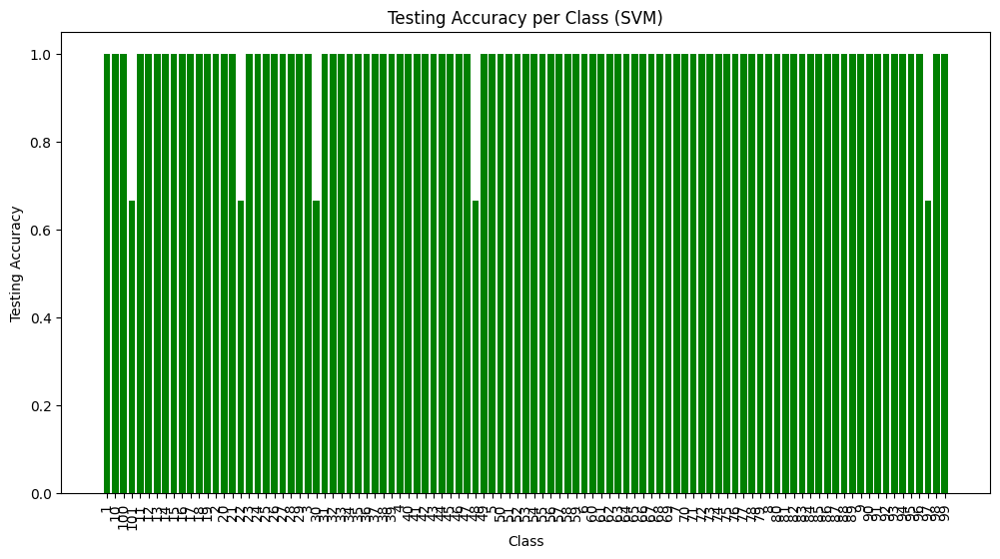


✅ Testing Accuracy: 0.9835


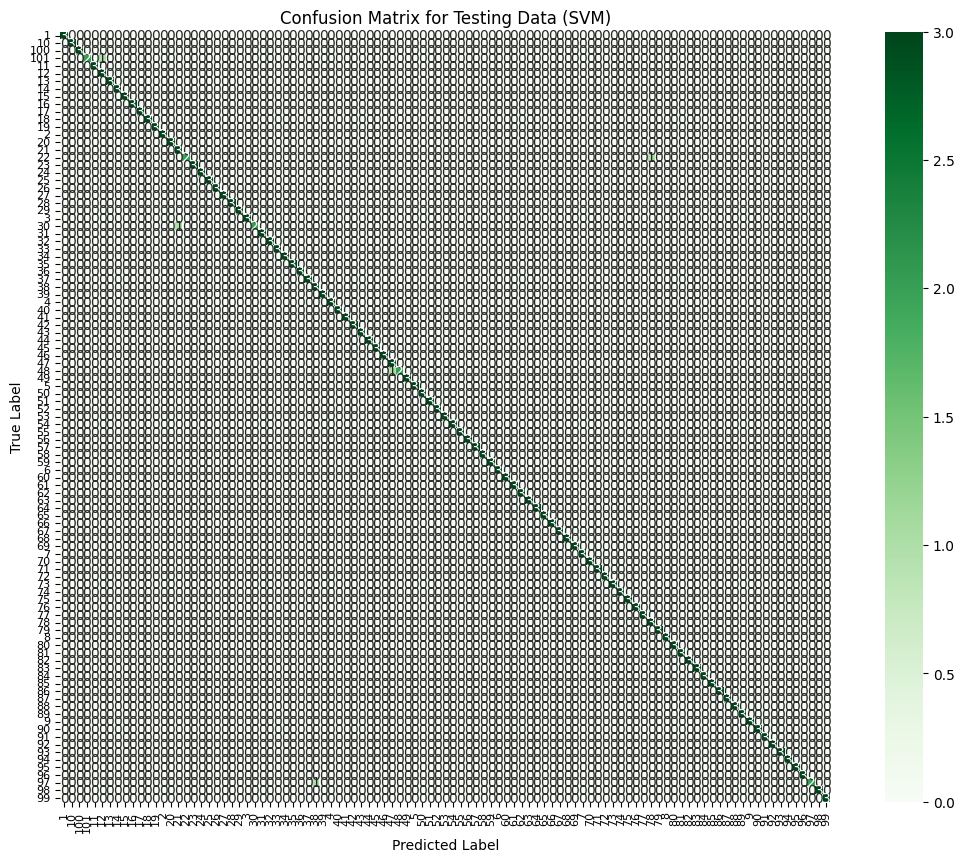

In [23]:
# Load testing dataset
test_excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")
test_df = pd.read_excel(test_excel_path)

# Prepare features and labels for testing data
X_test = test_df.iloc[:, 2:].values
y_test = test_df.iloc[:, 0].astype(str).values  # Class labels (folder names)

# Handle NaN values in X_test (replace with column mean)
X_test = imputer.transform(X_test)

# Encode class labels as numbers
y_test_encoded = label_encoder.transform(y_test)

# Standardize features (same as training data)
X_test = scaler.transform(X_test)

# Make predictions on the testing data
y_test_pred = svm_best.predict(X_test)

# Generate and print classification report for testing data
print("\n📊 Classification Report for Testing Data:")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_names))

# Compute per-class (testing) accuracy using the confusion matrix
test_conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
test_per_class_accuracy = {
    target_names[i]: test_conf_matrix[i, i] / test_conf_matrix[i].sum() if test_conf_matrix[i].sum() > 0 else 0.0
    for i in range(len(target_names))
}

# Plot per-class accuracy for testing data
plt.figure(figsize=(12, 6))
plt.bar(test_per_class_accuracy.keys(), test_per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Testing Accuracy')
plt.xlabel('Class')
plt.title('Testing Accuracy per Class (SVM)')
plt.show()

# Overall Testing Accuracy
test_acc = accuracy_score(y_test_encoded, y_test_pred)
print(f"\n✅ Testing Accuracy: {test_acc:.4f}")

# Improved Confusion Matrix Plot for Testing Data
plt.figure(figsize=(14, 10))
sns.heatmap(test_conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Testing Data (SVM)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Training and Testing Time

In [23]:
import time

# Measure Training Time
start_train = time.time()
svm_best.fit(X, y_encoded)  # Train the best model
end_train = time.time()
train_time = end_train - start_train
print(f"\n⏳ Training Time: {train_time:.4f} seconds")

# Measure Testing Time
start_test = time.time()
y_test_pred = svm_best.predict(X_test)  # Make predictions on test data
end_test = time.time()
test_time = end_test - start_test
print(f"\n⏳ Testing Time: {test_time:.4f} seconds")



⏳ Training Time: 0.6547 seconds

⏳ Testing Time: 0.0315 seconds


## LIME(SVM)

True Label: 47
                     Feature    Weight
0           MFCC_18 <= -0.67  0.004956
1             MFCC_40 > 0.45  0.004931
2            MFCC_1 <= -0.55  0.004066
3           MFCC_19 <= -0.69  0.003804
4            MFCC_2 <= -0.69  0.003193
5             MFCC_35 > 0.39  0.002645
6            MFCC_8 <= -0.63  0.002483
7           MFCC_29 <= -0.63  0.002156
8               Pitch > 0.45  0.002133
9             MFCC_34 > 0.37  0.002019
10            MFCC_33 > 0.37  0.001762
11            MFCC_32 > 0.42  0.001466
12          MFCC_28 <= -0.60  0.001394
13            MFCC_36 > 0.43  0.001320
14   -0.71 < MFCC_5 <= -0.04  0.001281
15     0.04 < MFCC_3 <= 0.74 -0.001064
16   -0.71 < MFCC_6 <= -0.03  0.000965
17            MFCC_37 > 0.42  0.000815
18  -0.68 < MFCC_21 <= -0.07  0.000624
19    -0.67 < MFCC_4 <= 0.07  0.000544


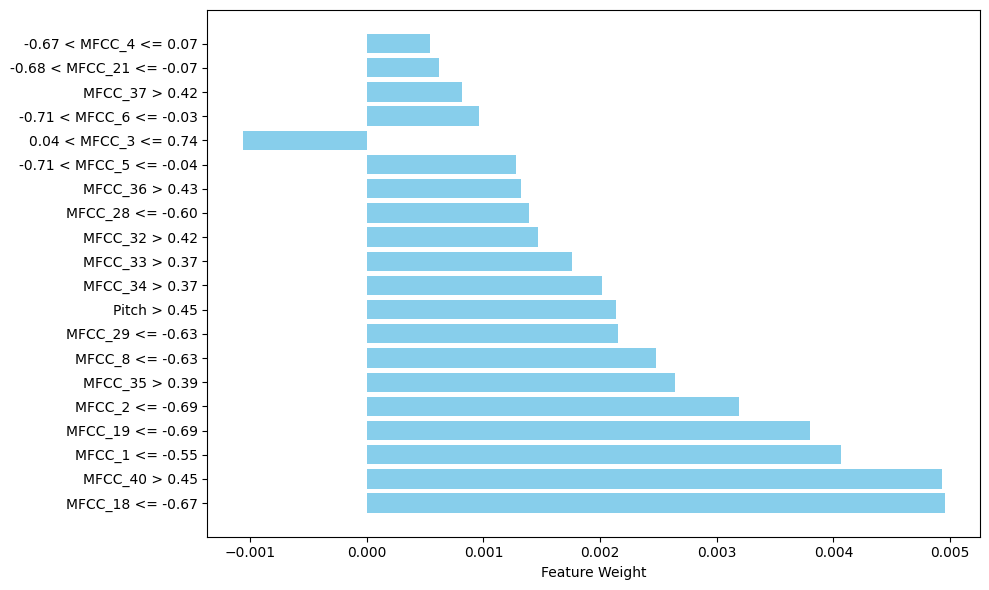

In [24]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X,  # Training data
    feature_names=df.columns[2:],  # Feature names (MFCC + Pitch features)
    class_names=target_names,  # Class names
    mode='classification',  # Mode (classification or regression)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Function to generate LIME explanation and plot bar chart
def explain_and_plot(sample_index):
    # Choose a sample from the test data to explain
    sample = X_test[sample_index]
    true_label = y_test[sample_index]

    # Print the true label
    print(f"True Label: {true_label}")

    # Get the predicted class
    predicted_class = svm_best.predict([sample])[0]  # Get the predicted class for the sample

    # Explain the prediction for the chosen sample
    explanation = explainer.explain_instance(
        data_row=sample,  # The sample to explain
        predict_fn=svm_best.predict_proba,  # Prediction function (must output probabilities)
        num_features=20,  # Number of features to include in the explanation
        top_labels=1  # Number of top predicted labels to explain
    )

    # Extract feature names and weights for the predicted class
    exp_list = explanation.as_list(label=predicted_class)  # Use the predicted class
    features, weights = zip(*exp_list)

    # Create a DataFrame for better visualization
    explanation_df = pd.DataFrame({
        'Feature': features,
        'Weight': weights
    })

    # Print the DataFrame
    print(explanation_df)

    # Create a bar plot for better visualization
    plt.figure(figsize=(10, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Feature Weight')
    plt.tight_layout()  # Improve spacing
    plt.savefig("TMFCC_LIME_SVM.png", dpi=300, bbox_inches='tight')
    plt.show()

    # Print the explanation (if using Jupyter Notebook)
    explanation.show_in_notebook()

# Example usage
sample_index = 140  # Change this to any index in the test set
explain_and_plot(sample_index)

## AUC and ROC

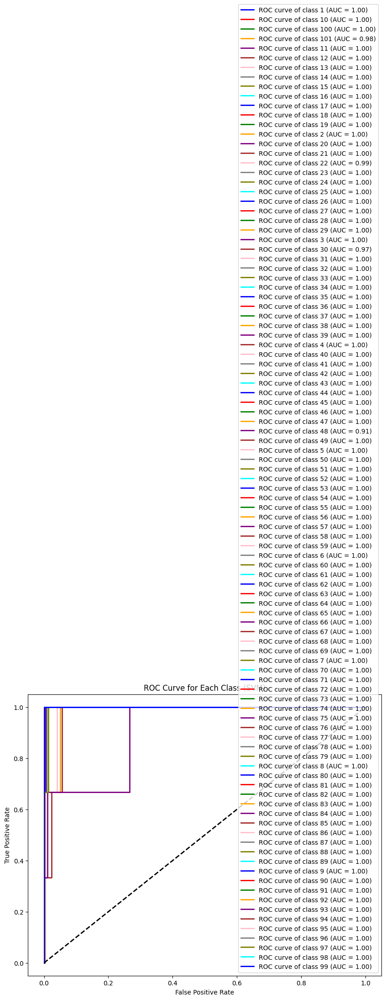

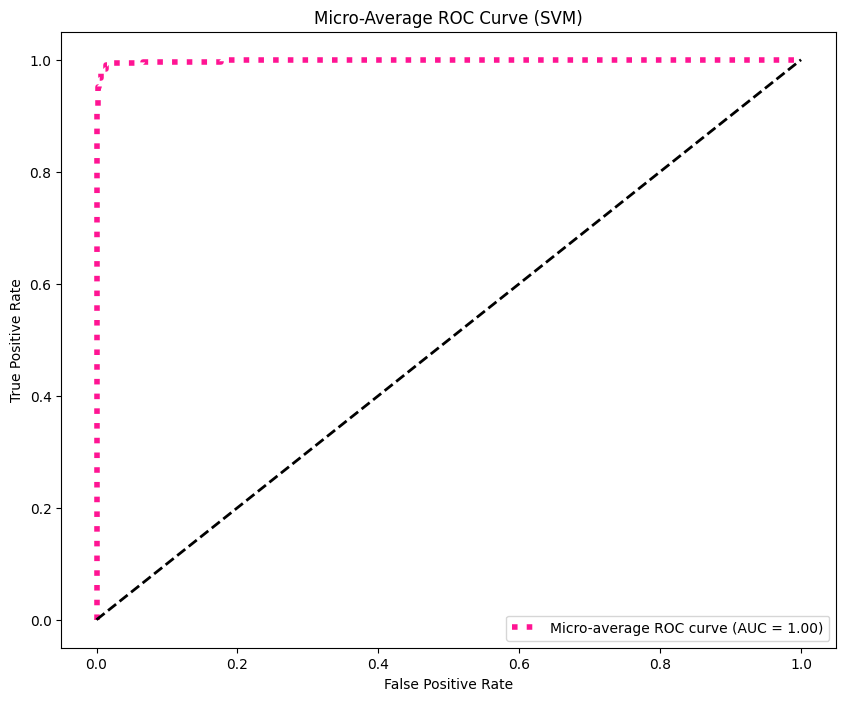

In [25]:
# Get predicted probabilities for each class (SVM model)
y_test_proba_svm = svm_best.predict_proba(X_test)

# Binarize the true labels for multi-class ROC
y_test_binarized_svm = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

# Compute ROC curve and AUC for each class
fpr_svm = dict()
tpr_svm = dict()
roc_auc_svm = dict()
n_classes = len(target_names)

for i in range(n_classes):
    fpr_svm[i], tpr_svm[i], _ = roc_curve(y_test_binarized_svm[:, i], y_test_proba_svm[:, i])
    roc_auc_svm[i] = auc(fpr_svm[i], tpr_svm[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_svm[i], tpr_svm[i], color=color, lw=2,
             label=f'ROC curve of class {target_names[i]} (AUC = {roc_auc_svm[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class (SVM)')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and AUC
fpr_svm["micro"], tpr_svm["micro"], _ = roc_curve(y_test_binarized_svm.ravel(), y_test_proba_svm.ravel())
roc_auc_svm["micro"] = auc(fpr_svm["micro"], tpr_svm["micro"])

# Plot micro-average ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_svm["micro"], tpr_svm["micro"], label=f'Micro-average ROC curve (AUC = {roc_auc_svm["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve (SVM)')
plt.legend(loc="lower right")
plt.show()

# XG Boost

# Training

Running 7-Fold Cross-Validation with Grid Search for XGBoost...

✅ Best Parameters for XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200, 'subsample': 0.8}
✅ Best Cross-Validation Accuracy: 0.8557

📊 Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.71      0.83         7
          10       1.00      0.86      0.92         7
         100       0.86      0.86      0.86         7
         101       0.86      0.86      0.86         7
          11       1.00      0.86      0.92         7
          12       0.78      1.00      0.88         7
          13       0.83      0.71      0.77         7
          14       1.00      0.86      0.92         7
          15       1.00      1.00      1.00         7
          16       0.86      0.86      0.86         7
          17       0.86      0.86      0.86         7
          18       0.88      1.00      0.93         7
          19       1.00      0.86      0.92         7
  

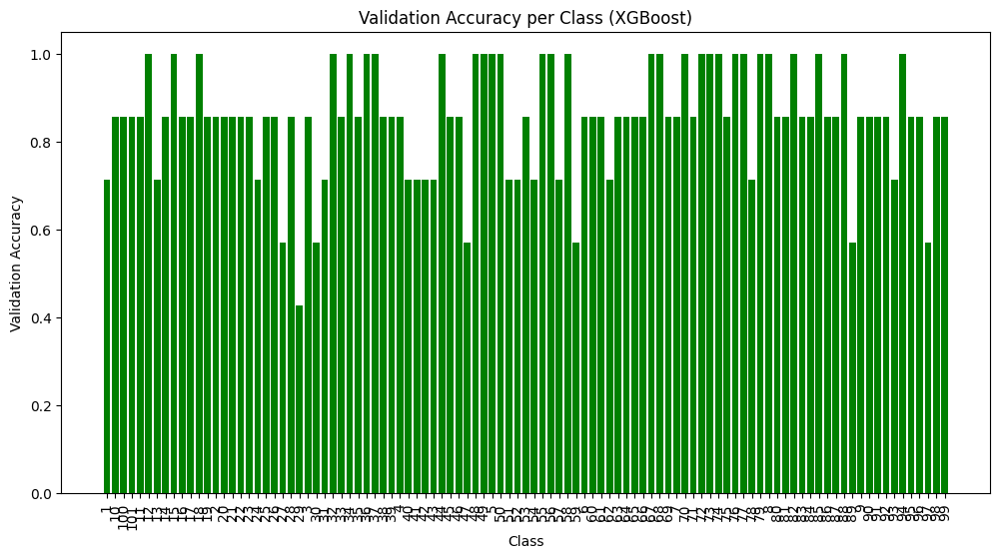


✅ Training Accuracy: 1.0000


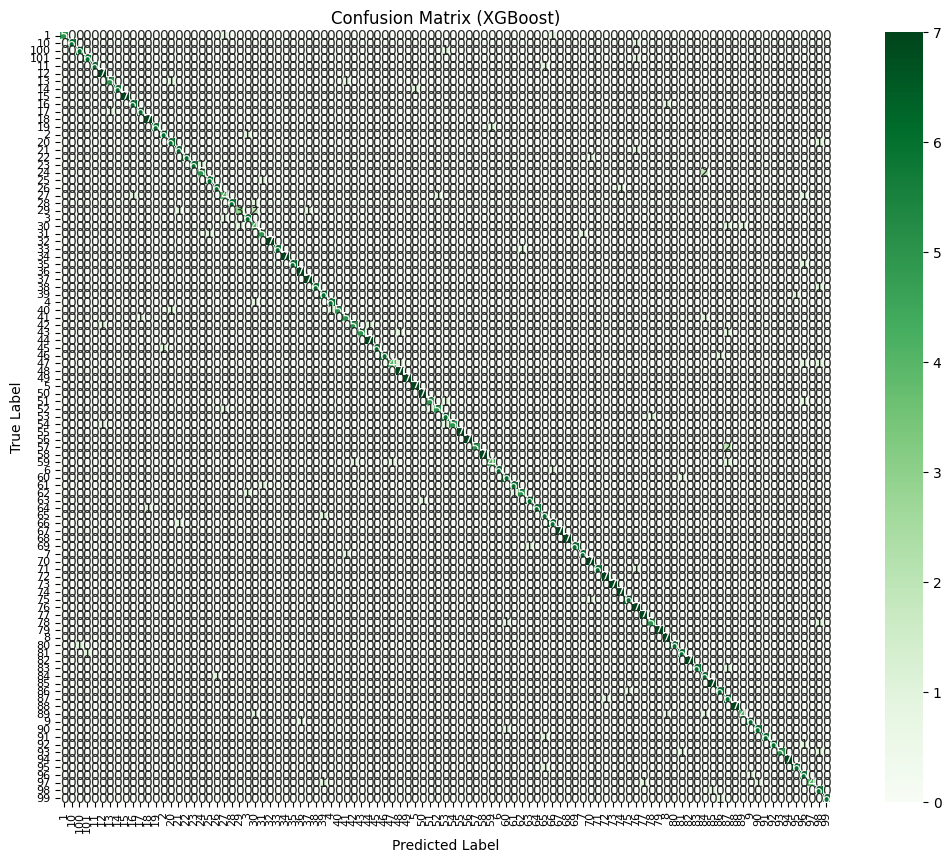

In [26]:
# Suppress warnings from XGBoost
warnings.filterwarnings("ignore", category=UserWarning, module="xgboost")

# Load dataset
excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\train_features.xlsx")
df = pd.read_excel(excel_path)

# Prepare features and labels
X = df.iloc[:, 2:].values  # Extract MFCC + Pitch features
y = df.iloc[:, 0].astype(str).values  # Class labels (folder names) as strings

# Handle NaN values in X (replace with column mean)
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)

# Encode class labels as numbers
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Convert target names to strings (for classification report)
target_names = label_encoder.classes_

# Standardize features (XGBoost performs well without it, but let's keep it)
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Define XGBoost model
xgb = XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', random_state=42)

# Define parameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0]
}

# Stratified 7-Fold Cross-Validation
skf = StratifiedKFold(n_splits=7, shuffle=True, random_state=42)
grid_search = GridSearchCV(xgb, param_grid, cv=skf, scoring='accuracy', n_jobs=-1)

# Run Grid Search
print("Running 7-Fold Cross-Validation with Grid Search for XGBoost...")
grid_search.fit(X, y_encoded)

# Get best parameters and accuracy
best_params = grid_search.best_params_
best_score = grid_search.best_score_
print("\n✅ Best Parameters for XGBoost:", best_params)
print(f"✅ Best Cross-Validation Accuracy: {best_score:.4f}")

# Train the best XGBoost model
xgb_best = XGBClassifier(**best_params, objective='multi:softmax', eval_metric='mlogloss', random_state=42)
xgb_best.fit(X, y_encoded)

# Cross-validated predictions on full dataset
y_pred = cross_val_predict(xgb_best, X, y_encoded, cv=skf)

# Generate and print classification report
print("\n📊 Classification Report:")
print(classification_report(y_encoded, y_pred, target_names=target_names))

# Compute per-class (validation) accuracy using the confusion matrix
conf_matrix = confusion_matrix(y_encoded, y_pred)
per_class_accuracy = {target_names[i]: conf_matrix[i, i] / conf_matrix[i].sum() if conf_matrix[i].sum() > 0 else 0.0 for i in range(len(target_names))}

# Plot per-class accuracy
plt.figure(figsize=(12, 6))
plt.bar(per_class_accuracy.keys(), per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Validation Accuracy')
plt.xlabel('Class')
plt.title('Validation Accuracy per Class (XGBoost)')
plt.show()

# Training Accuracy on full training data
y_train_pred = xgb_best.predict(X)
train_acc = accuracy_score(y_encoded, y_train_pred)
print(f"\n✅ Training Accuracy: {train_acc:.4f}")

# Improved Confusion Matrix Plot
plt.figure(figsize=(14, 10))  # Increase figure size for better readability
sns.heatmap(conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (XGBoost)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

# Testing


📊 Classification Report for Testing Data (XGBoost):
              precision    recall  f1-score   support

           1       1.00      0.67      0.80         3
          10       1.00      0.67      0.80         3
         100       1.00      1.00      1.00         3
         101       0.50      0.67      0.57         3
          11       1.00      1.00      1.00         3
          12       1.00      1.00      1.00         3
          13       0.75      1.00      0.86         3
          14       1.00      1.00      1.00         3
          15       0.50      0.67      0.57         3
          16       1.00      1.00      1.00         3
          17       1.00      0.67      0.80         3
          18       0.67      0.67      0.67         3
          19       1.00      1.00      1.00         3
           2       1.00      1.00      1.00         3
          20       1.00      1.00      1.00         3
          21       0.75      1.00      0.86         3
          22       1.00     

D:\Anaconda Navigator\envs\conference_env\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda Navigator\envs\conference_env\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
D:\Anaconda Navigator\envs\conference_env\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", le

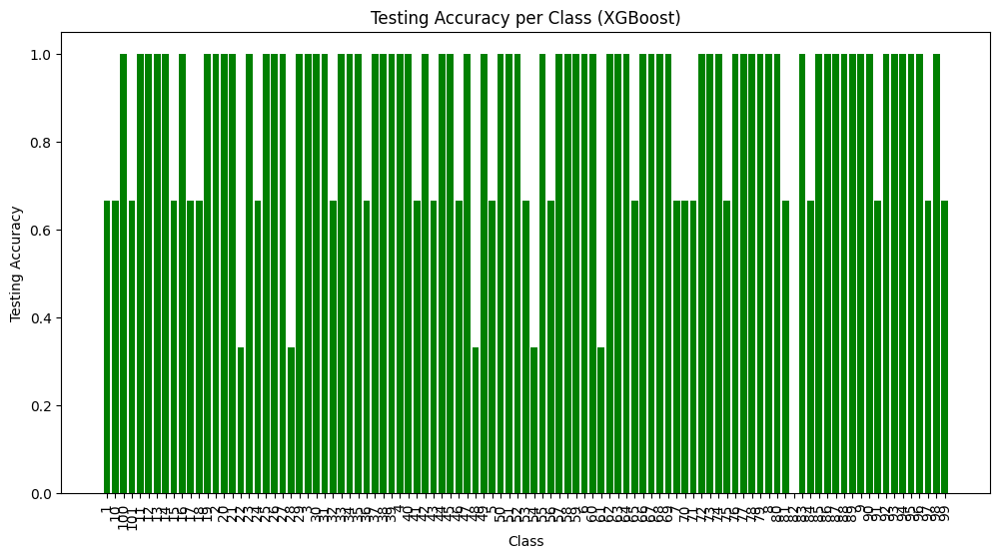


✅ Testing Accuracy (XGBoost): 0.8746


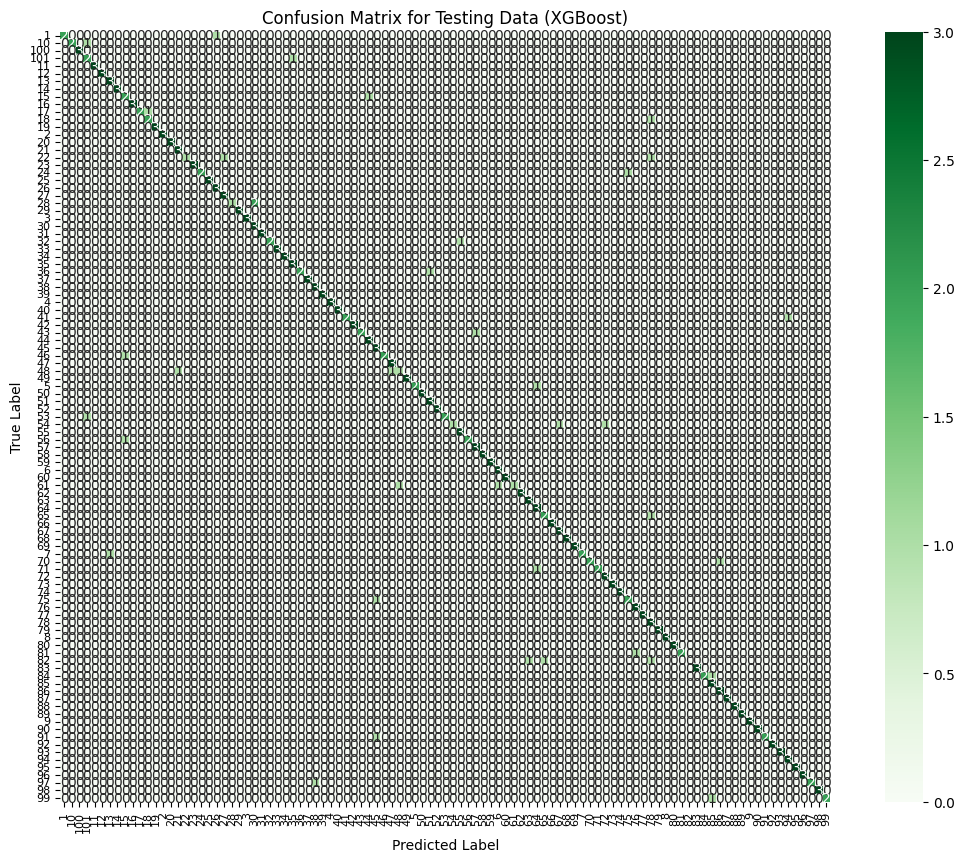

In [27]:
# Load testing dataset
test_excel_path = os.path.expanduser(r"E:\PythonJupyter\70_30 Split\test_features.xlsx")
test_df = pd.read_excel(test_excel_path)

# Prepare features and labels for testing data
X_test = test_df.iloc[:, 2:].values
y_test = test_df.iloc[:, 0].astype(str).values  # Class labels (folder names)

# Handle NaN values in X_test (replace with column mean)
X_test = imputer.transform(X_test)

# Encode class labels as numbers
y_test_encoded = label_encoder.transform(y_test)

# Standardize features (same as training data)
X_test = scaler.transform(X_test)

# Make predictions on the testing data using XGBoost
y_test_pred = xgb_best.predict(X_test)

# Generate and print classification report for testing data
print("\n📊 Classification Report for Testing Data (XGBoost):")
print(classification_report(y_test_encoded, y_test_pred, target_names=target_names))

# Compute per-class (testing) accuracy using the confusion matrix
test_conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
test_per_class_accuracy = {
    target_names[i]: test_conf_matrix[i, i] / test_conf_matrix[i].sum() if test_conf_matrix[i].sum() > 0 else 0.0
    for i in range(len(target_names))
}

# Plot per-class accuracy for testing data
plt.figure(figsize=(12, 6))
plt.bar(test_per_class_accuracy.keys(), test_per_class_accuracy.values(), color='green')
plt.xticks(rotation=90)
plt.ylabel('Testing Accuracy')
plt.xlabel('Class')
plt.title('Testing Accuracy per Class (XGBoost)')
plt.show()

# Overall Testing Accuracy
test_acc = accuracy_score(y_test_encoded, y_test_pred)
print(f"\n✅ Testing Accuracy (XGBoost): {test_acc:.4f}")

# Improved Confusion Matrix Plot for Testing Data
plt.figure(figsize=(14, 10))
sns.heatmap(test_conf_matrix, annot=True, cmap='Greens', fmt='d', square=True,
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for Testing Data (XGBoost)')
plt.xticks(rotation=90, fontsize=8)
plt.yticks(fontsize=8)
plt.show()

## Training and Testing Time

In [28]:
import time

# Measure Training Time
start_train = time.time()
xgb_best.fit(X, y_encoded)  # Train the best model
end_train = time.time()
train_time = end_train - start_train
print(f"\n⏳ Training Time: {train_time:.4f} seconds")

# Measure Testing Time
start_test = time.time()
y_test_pred = xgb_best.predict(X_test)  # Make predictions on test data
end_test = time.time()
test_time = end_test - start_test
print(f"\n⏳ Testing Time: {test_time:.4f} seconds")



⏳ Training Time: 8.7452 seconds

⏳ Testing Time: 0.0119 seconds


## LIME(XGB)

True Label: 47
                     Feature    Weight
0           MFCC_18 <= -0.67  0.018979
1            MFCC_2 <= -0.69  0.007315
2               Pitch > 0.45  0.007133
3           MFCC_19 <= -0.69  0.006734
4             MFCC_40 > 0.45  0.005444
5            MFCC_8 <= -0.63  0.004353
6           MFCC_29 <= -0.63  0.004179
7           MFCC_28 <= -0.60  0.002805
8    -0.24 < MFCC_39 <= 0.53 -0.002228
9   -0.71 < MFCC_22 <= -0.00  0.001828
10            MFCC_35 > 0.39  0.001804
11  -0.58 < MFCC_25 <= -0.02  0.001762
12    -0.60 < MFCC_7 <= 0.03  0.001632
13          MFCC_12 <= -0.57  0.001618
14     0.04 < MFCC_3 <= 0.74  0.001357
15  -0.66 < MFCC_14 <= -0.00  0.001312
16   -0.71 < MFCC_6 <= -0.03  0.001197
17   -0.04 < MFCC_16 <= 0.56 -0.001181
18   -0.65 < MFCC_9 <= -0.06  0.001135
19   -0.00 < MFCC_11 <= 0.73  0.000983


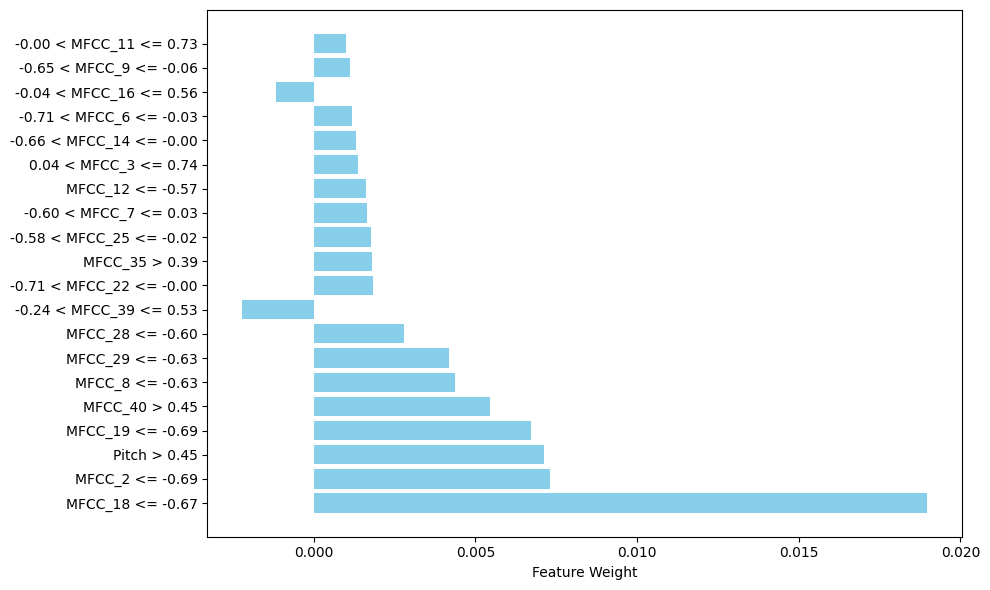

In [29]:
import lime
import lime.lime_tabular
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X,  # Training data
    feature_names=df.columns[2:],  # Feature names (MFCC + Pitch features)
    class_names=target_names,  # Class names
    mode='classification',  # Mode (classification or regression)
    discretize_continuous=True  # Discretize continuous features for better interpretability
)

# Function to generate LIME explanation and plot bar chart
def explain_and_plot(sample_index):
    # Choose a sample from the test data to explain
    sample = X_test[sample_index]
    true_label = y_test[sample_index]

    # Print the true label
    print(f"True Label: {true_label}")

    # Get the predicted class
    predicted_class = xgb_best.predict([sample])[0]  # Get the predicted class for the sample

    # Explain the prediction for the chosen sample
    explanation = explainer.explain_instance(
        data_row=sample,  # The sample to explain
        predict_fn=xgb_best.predict_proba,  # Prediction function (must output probabilities)
        num_features=20,  # Number of features to include in the explanation
        top_labels=1  # Number of top predicted labels to explain
    )

    # Extract feature names and weights for the predicted class
    exp_list = explanation.as_list(label=predicted_class)  # Use the predicted class
    features, weights = zip(*exp_list)

    # Create a DataFrame for better visualization
    explanation_df = pd.DataFrame({
        'Feature': features,
        'Weight': weights
    })

    # Print the DataFrame
    print(explanation_df)

    # Create a bar plot for better visualization
    plt.figure(figsize=(10, 6))
    plt.barh(features, weights, color='skyblue')
    plt.xlabel('Feature Weight')
    plt.tight_layout()  # Improve spacing
    plt.show()

    # Print the explanation (if using Jupyter Notebook)
    explanation.show_in_notebook()

# Example usage
sample_index = 140  # Change this to any index in the test set
explain_and_plot(sample_index)

# AUC & ROC

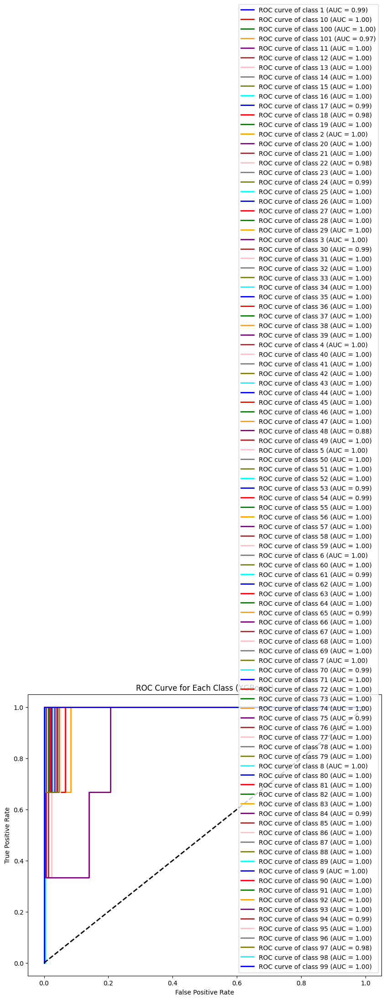

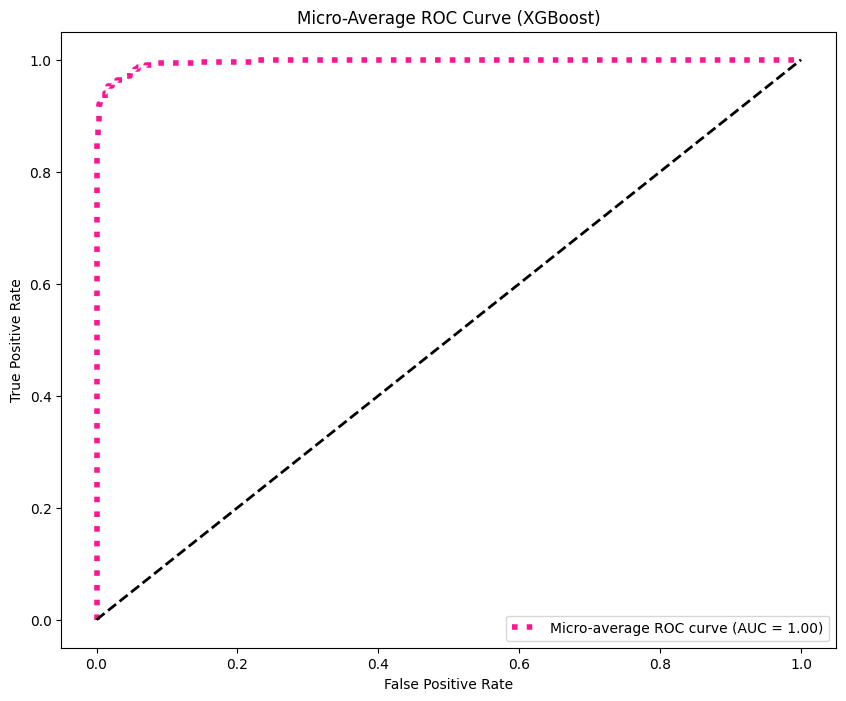

In [30]:
# Get predicted probabilities for each class (XGBoost model)
y_test_proba_xgb = xgb_best.predict_proba(X_test)

# Binarize the true labels for multi-class ROC
y_test_binarized_xgb = label_binarize(y_test_encoded, classes=np.unique(y_test_encoded))

# Compute ROC curve and AUC for each class
fpr_xgb = dict()
tpr_xgb = dict()
roc_auc_xgb = dict()
n_classes = len(target_names)

for i in range(n_classes):
    fpr_xgb[i], tpr_xgb[i], _ = roc_curve(y_test_binarized_xgb[:, i], y_test_proba_xgb[:, i])
    roc_auc_xgb[i] = auc(fpr_xgb[i], tpr_xgb[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
colors = cycle(['blue', 'red', 'green', 'orange', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_xgb[i], tpr_xgb[i], color=color, lw=2,
             label=f'ROC curve of class {target_names[i]} (AUC = {roc_auc_xgb[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class (XGBoost)')
plt.legend(loc="lower right")
plt.show()

# Compute micro-average ROC curve and AUC
fpr_xgb["micro"], tpr_xgb["micro"], _ = roc_curve(y_test_binarized_xgb.ravel(), y_test_proba_xgb.ravel())
roc_auc_xgb["micro"] = auc(fpr_xgb["micro"], tpr_xgb["micro"])

# Plot micro-average ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr_xgb["micro"], tpr_xgb["micro"], label=f'Micro-average ROC curve (AUC = {roc_auc_xgb["micro"]:.2f})', color='deeppink', linestyle=':', linewidth=4)

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve (XGBoost)')
plt.legend(loc="lower right")
plt.show()